In [1]:
from astropy.io import fits
import os
from PyAstronomy.pyasl import foldAt
import shutil
import numpy as np
import matplotlib.pyplot as plt
from datetime import datetime
from scipy import optimize
from scipy.interpolate import CubicSpline
from scipy.integrate import simps
from scipy.interpolate import UnivariateSpline
from scipy.ndimage import gaussian_filter
import scipy.signal as signal

# Jul18 Blue changing

In [2]:
def total_seconds(td):
    total = (td.day - 1) * 24 * 60 *60
    total = total + td.hour * 60 * 60
    total = total + td.minute * 60
    total = total + (td.microsecond/1000000)
    return total
def find_nearest(array, value):
    array = np.asarray(array)
    idx = (np.abs(array - value)).argmin()
    return array[idx]
def find_nearest_id(array, value):
    array = np.asarray(array)
    idx = (np.abs(array - value)).argmin()
    return idx
def func(res, points):
    meanArr = []
    inter = res[0]
    grad = res[1]
    for point in points:
        mean = grad * point + inter
        meanArr.append(mean)
    return meanArr
def binArray(data, axis, binstep, binsize, func=np.nanmean):
    data = np.array(data)
    dims = np.array(data.shape)
    argdims = np.arange(data.ndim)
    argdims[0], argdims[axis]= argdims[axis], argdims[0]
    data = data.transpose(argdims)
    data = [func(np.take(data,np.arange(int(i*binstep),int(i*binstep+binsize)),0),0) for i in np.arange(dims[axis]//binstep)]
    data = np.array(data).transpose(argdims)
    return data

In [11]:
y = [2,3,4,5]
x=[0,1,2,3]
res = np.poly1d(np.polyfit(x, y, 1))
print(res)
print(type(res))
print(res[0])

        
someArray = func(res, x)
print(someArray)

 
1 x + 2
<class 'numpy.poly1d'>
2.000000000000001
[2.000000000000001, 3.000000000000001, 4.0, 5.0]


In [3]:
xpoints = np.linspace(3622.6323, 5418.2984, 4099)
dataStart = find_nearest_id(xpoints, 3934)
dataFinish = find_nearest_id(xpoints, 3968)
print(dataStart, dataFinish)

711 788


In [20]:
lines_per_file = 5
smallfile = None
path = '/home/nwal/Desktop/gd356_isis/jul18/sat/set/'
with open(path+'weightsB') as bigfile:
    for lineno, line in enumerate(bigfile):
        if lineno % lines_per_file == 0:
            if smallfile:
                smallfile.close()
            small_filename = '/home/nwal/Desktop/gd356_isis/jul18/sat/set/weightsB_{}'.format(lineno + lines_per_file)
            smallfile = open(small_filename, "w")
        smallfile.write(line)
    if smallfile:
        smallfile.close()

# Jul18 Blue
### Inverse of variance

In [16]:
timeArray = []
timeOffset = datetime.strptime("0:00:00.0", '%H:%M:%S.%f')
dataArray1 = []
times = []
errorBars = []
counter = 0
weights = []
stds = []
path = '/home/nwal/Desktop/gd356_isis/jul18/sat/set/'
with open(path+'BTar') as file:
    for line in file:
        line = line.strip('\n')
        filepath = path + line
        hdul = fits.open(filepath)
        typeEx = hdul[0].data
        data = typeEx[:, 0]
        data = data[0,:]
        
        xpoints = np.linspace(3622.6323, 5418.2984, 4099)
        dataStart = find_nearest_id(xpoints, 5100)
        dataFinish = find_nearest_id(xpoints, 5200)
        #print(dataStartxpoints = np.linspace(3622.6323, 5418.2984, 4099)
        dataStart = find_nearest_id(xpoints, 5100)
        dataFinish = find_nearest_id(xpoints, 5200),dataFinish)
        dataUn = data[dataStart:dataFinish]
        xArrS = find_nearest(xpoints, 5100)
        xArrF = find_nearest(xpoints,5200)
        xArr = np.linspace(xArrS, xArrF, len(dataUn))
        res = np.poly1d(np.polyfit(xArr, dataUn, 1))
        means = func(res, xArr)
        diff = (np.abs(dataUn-means))**2
        summ = np.sqrt((np.sum(diff)/len(dataUn)))
        weights.append(1/(summ**2))
        hdul.close()

print(weights)
with open('/home/nwal/Desktop/gd356_isis/jul18/sat/set/weights', 'w') as f:
    for item in weights:
        f.write("%s\n" % item)

[0.012529668988592344, 0.011560415280238186, 0.012447914177222255, 0.012356051700446513, 0.010870956807221801, 0.019327046543864666, 0.011053230246685837, 0.009980232549494164, 0.01304807864425943, 0.013909858271924912, 0.013189128029479889, 0.012901829301202723, 0.011498217139009137, 0.012337110212451277, 0.01166269566500503, 0.012470460837233938, 0.01301054302471317, 0.01184440214718397, 0.010643539285942926, 0.009644314058838335, 0.010764729771930416, 0.009699044212523874, 0.012198845932788688, 0.011643801741728943, 0.0004843707105167956, 0.01051335277279049, 0.011943523317099755, 0.01031088744511654, 0.010426843946866963, 0.012872764106626732, 0.010556591594731306, 0.008998531531148149, 0.012214244221664849, 0.00915278224319761, 0.009405139670629638, 0.008397036806129105, 0.010519510393340472, 0.012623762995673133, 0.009953229264417402, 0.011713753229091047, 0.03131139875634364, 0.01204102217984648, 0.012572003927618251, 0.010086153176793348, 0.009306473190520349, 0.008809175808344

# Jul18 Red

In [13]:
timeArray = []
timeOffset = datetime.strptime("0:00:00.0", '%H:%M:%S.%f')
dataArray1 = []
times = []
errorBars = []
counter = 0
weights = []
path = '/home/nwal/Desktop/gd356_isis/jul18/sat/'
with open(path+'RedTargets') as file:
    for line in file:
        line = line.strip('\n')
        filepath = path + line
        hdul = fits.open(filepath)
        typeEx = hdul[0].data
        data = typeEx[:, 0]
        data = data[0,:]
        
        xpoints = np.linspace(5516.072, 7529.058, 4096)
        dataStart = find_nearest_id(xpoints, 5900)
        dataFinish = find_nearest_id(xpoints, 6200)
        #print(dataStart,dataFinish)
        dataUn = data[dataStart:dataFinish]
        temp = np.std(dataUn)
        weight = 1/(temp**2)
        weights.append(weight)
        hdul.close()

print(weights)


with open('/home/nwal/Desktop/gd356_isis/Jul18Red', 'w') as f:
    for item in weights:
        f.write("%s\n" % item)

[550.294508926722, 645.5916984947619, 617.0262114279166, 690.0092045551761, 584.7776456941707, 729.8981682213636, 747.4661037261624, 456.63678237797524, 780.6956398751342, 752.3004459680471, 564.469903501016, 619.2653626117684, 495.54738226522744, 225.84685309963473, 783.802392652534, 710.9230414631141, 652.7412494172783, 751.0829487236005, 671.8811957953789, 786.0076552142901, 713.9838606280301, 695.2376209802628, 763.8782290099997, 675.200546341355, 671.4172974507716, 835.1736886603011, 795.1865023219214, 720.1043388696561, 771.9655554491245, 770.56311375657, 648.6614171367307, 719.4632203404943, 762.0289244591994, 662.6767004460625, 848.0239931539679, 782.8182731363078, 792.2133677246698, 651.9697108722584, 772.3879302358896, 769.8973851726695, 137.8074729962524, 757.9105747580452, 708.0492985731378, 709.9811333932947, 749.7672873767057, 186.41624180777808, 818.8987139770309, 714.6400140171486, 661.9369677468709, 620.9771470745775, 624.1903319940782, 662.4717370644546, 584.747829920

# May19 Blue

In [16]:
timeArray = []
timeOffset = datetime.strptime("0:00:00.0", '%H:%M:%S.%f')
dataArray1 = []
times = []
errorBars = []
counter = 0
weights = []
path = '/home/nwal/Desktop/gd356_isis/may19/sat/'
with open(path+'BigBlueCC') as file:
    for line in file:
        line = line.strip('\n')
        filepath = path + line
        hdul = fits.open(filepath)
        typeEx = hdul[0].data
        data = typeEx
        
        xpoints = np.linspace(3622.6323, 5418.2984, 4099)
        dataStart = find_nearest_id(xpoints, 3975)
        dataFinish = find_nearest_id(xpoints, 4150)
        #print(dataStart,dataFinish)
        dataUn = data[dataStart:dataFinish]
        temp = np.std(dataUn)
        dataStart = find_nearest_id(xpoints, 4500)
        dataFinish = find_nearest_id(xpoints, 4675)
        dataUn = data[dataStart:dataFinish]
        temp2 = np.std(dataUn)
        weight = 1/(((temp2+temp)/2)**2)
        weights.append(weight)
        hdul.close()

print(weights)
with open('/home/nwal/Desktop/gd356_isis/May19Blue', 'w') as f:
    for item in weights:
        f.write("%s\n" % item)

[388.8306179667127, 339.27969376568484, 314.3792971666141, 283.37091122610565, 352.7725919856517, 293.1003489026294, 314.02496487443887, 241.98352667203844, 325.0439636491967, 276.21800876857213, 314.34516157188085, 230.43540040539256, 276.9543013682198, 283.8233848336607, 372.4400765820813, 298.71523516772913, 314.6718785517403, 309.48111817070475, 380.9569517574444, 296.74652530806253, 320.1573574429576, 285.9481605056236, 290.4142654833773, 274.4851200990052, 262.13471260389247, 265.3561584764647, 115.42197750799203, 258.3001134338346, 280.5329290613543, 218.52650862984112, 208.16280668355753, 240.3912988231785, 288.50942478975384, 198.52199983176263, 197.80877312801576, 164.0140134914519, 191.87863642712193, 231.47729725537116, 230.84355728903495, 253.45432509910836, 264.09373751425306, 250.8646476732865, 233.62384751118282, 261.7331439553936, 239.9123252369115, 196.11390737090207, 219.31930455517235, 293.88681995307434, 355.5187860572314, 342.43975007909427, 308.23709039425813, 28

# May19 Red

In [18]:
timeArray = []
timeOffset = datetime.strptime("0:00:00.0", '%H:%M:%S.%f')
dataArray1 = []
times = []
errorBars = []
counter = 0
weights = []
path = '/home/nwal/Desktop/gd356_isis/may19/sat/'
with open(path+'RTarC') as file:
    for line in file:
        line = line.strip('\n')
        filepath = path + line
        hdul = fits.open(filepath)
        typeEx = hdul[0].data
        data = typeEx
        
        xpoints = np.linspace(5516.072, 7529.058, 4096)
        dataStart = find_nearest_id(xpoints, 5900)
        dataFinish = find_nearest_id(xpoints, 6200)
        #print(dataStart,dataFinish)
        dataUn = data[dataStart:dataFinish]
        temp = np.std(dataUn)
        weight = 1/(temp**2)
        weights.append(weight)
        hdul.close()

print(weights)


with open('/home/nwal/Desktop/gd356_isis/May19Red', 'w') as f:
    for item in weights:
        f.write("%s\n" % item)

[610.1500967307962, 557.6099310435408, 439.23510809379167, 447.78115309244714, 551.6070103626612, 473.13855925495864, 476.95368090960994, 485.15276277055415, 492.2442595048736, 477.0266404517482, 465.05986177837605, 391.97553786455944, 473.05928382776546, 478.62288838932614, 582.0051929558281, 498.8861891031835, 535.0515234993816, 507.64100118099884, 505.4653619273444, 442.70388793856466, 467.4250057611045, 559.1834047275482, 475.15973495985446, 269.8900470544602, 390.0019906763708, 301.89768499001, 414.1858926649592, 399.02794266722225, 453.3777247660428, 349.5111276185019, 441.7390022075644, 435.5834704415462, 494.51029829254094, 262.40582064442606, 309.7609157735149, 350.3482804502726, 375.05055761899837, 361.6577769623166, 375.7719332489786, 410.7855085450873, 333.0299908898579, 478.9198751068633, 381.88030437683204, 419.1428679183846, 445.9388289413937, 409.43321851648517, 391.488626649658, 497.45209732285025, 531.9941492741721, 610.7755892214967, 507.8835298072658, 460.5276928857

In [20]:
timeArray = []
timeOffset = datetime.strptime("0:00:00.0", '%H:%M:%S.%f')
dataArray1 = []
times = []
errorBars = []
counter = 0
weights = []
path = '/home/nwal/Desktop/gd356_isis/jul18/sat/'
with open(path+'RedTargetsDum') as file:
    for line in file:
        line = line.strip('\n')
        filepath = path + line
        hdul = fits.open(filepath)
        typeEx = hdul[0].data
        data = typeEx[:, 0]
        data = data[0,:]
        
        xpoints = np.linspace(5516.072, 7529.058, 4096)
        dataStart = find_nearest_id(xpoints, 5900)
        dataFinish = find_nearest_id(xpoints, 6200)
        #print(dataStart,dataFinish)
        dataUn = data[dataStart:dataFinish]
        temp = np.std(dataUn)
        weight = 1/(temp**2)
        weights.append(weight)
        hdul.close()

print(weights)



[588.955832782552]


In [6]:
timeArray = []
timeOffset = datetime.strptime("0:00:00.0", '%H:%M:%S.%f')
dataArray1 = []
times = []
errorBars = []
counter = 0
weights = []
path = '/home/nwal/Desktop/gd356_isis/jul18/sat/set/'
with open(path+'BTar') as file:
    for line in file:
        line = line.strip('\n')
        filepath = path + line
        hdul = fits.open(filepath)
        typeEx = hdul[0].data
        data = typeEx[:, 0]
        data = data[0,:] #0 - 600
        #xpoints = np.linspace(3622.6323, 5418.2984, 4099)
        xpoints = np.linspace(0, 4099, 4099)
        dataStart = find_nearest_id(xpoints, 100)
        dataFinish = find_nearest_id(xpoints, 600)
        #print(dataStart,dataFinish)
        dataUn = data[dataStart:dataFinish]
        temp = np.mean(dataUn)
        weights.append(temp)
        hdul.close()

print(weights)

[2148.0745, 2223.8286, 2538.87, 2402.8022, 2636.39, 2728.8755, 2669.092, 2483.387, 2422.75, 2660.4631, 2611.9026, 2485.9817, 2419.155, 2508.685, 2562.1245, 2679.862, 2595.447, 2588.8884, 2593.9766, 2631.538, 2783.9885, 2487.1465, 2731.2908, 2647.0203, 2607.9294, 2720.6404, 2773.6504, 2693.8994, 2857.117, 2524.1423, 2416.25, 2623.3396, 2562.8577, 2814.2683, 2824.3372, 2929.0386, 2865.7007, 2485.9094, 2398.975, 2653.8967, 1469.6494, 2483.8865, 2422.1162, 2465.2058, 2730.9617, 2548.8618, 2503.7317, 2329.0066, 2332.1245, 2285.9094, 2284.4136, 2118.5276, 2299.89, 2430.3645, 2052.3901, 2209.882, 2098.6426, 2180.5247, 2077.7222, 2005.1226, 2003.7062, 2228.503, 2166.14, 1856.9237, 1887.3917, 2035.4205, 1963.9294, 1773.9364, 1975.8524, 1698.1653, 1710.855, 1617.2598, 1752.0277, 1499.6241, 1603.9933, 1184.212, 1183.5537, 1506.244, 1574.0223, 1751.2827, 1458.2205, 1437.515, 1186.7083, 1010.09814, 1252.9457, 1342.3632, 961.46063, 1097.4314, 1207.2275, 1064.8022, 1108.0118, 1163.9978, 1068.5901, 80

In [4]:
timeArray = []
timeOffset = datetime.strptime("0:00:00.0", '%H:%M:%S.%f')
dataArray1 = []
times = []
errorBars = []
counter = 0
exposures = []
path = '/home/nwal/Desktop/gd356_isis/jul18/sat/set/'
with open(path+'BTar') as file:
    for line in file:
        line = line.strip('\n')
        filepath = path + line
        hdul = fits.open(filepath)
        typeEx = hdul[0].header['EXPOSED']
        #xpoints = np.linspace(3622.6323, 5418.2984, 4099)
        exposures.append(typeEx)
        hdul.close()

print(exposures)
for element in exposures:
    if element != 120.01:
        print(element)

[120.01, 120.01, 120.01, 120.01, 120.01, 120.01, 120.01, 120.01, 120.01, 120.01, 120.01, 120.01, 120.01, 120.01, 120.01, 120.01, 120.01, 120.01, 120.01, 120.01, 120.01, 120.01, 120.01, 120.01, 120.01, 120.01, 120.01, 120.01, 120.01, 120.01, 120.01, 120.01, 120.01, 120.01, 120.01, 120.01, 120.01, 120.01, 120.01, 120.01, 120.01, 120.01, 120.01, 120.01, 120.01, 120.01, 120.01, 120.01, 120.01, 120.01, 120.01, 120.01, 120.01, 120.01, 120.01, 120.01, 120.01, 120.01, 120.01, 120.01, 120.01, 120.01, 120.01, 120.01, 120.01, 120.01, 120.01, 120.01, 120.01, 120.01, 120.01, 120.01, 120.01, 120.01, 120.01, 120.01, 120.01, 120.01, 120.01, 120.01, 120.01, 120.01, 120.01, 120.01, 120.01, 120.01, 120.01, 120.01, 120.01, 120.01, 120.01, 120.01, 120.01, 120.01, 120.01, 120.01, 120.01, 120.01, 120.01, 120.01, 120.01, 120.01, 120.01, 120.01, 120.01, 120.01, 120.01, 120.01, 120.01, 120.01, 120.01, 120.01, 120.01]


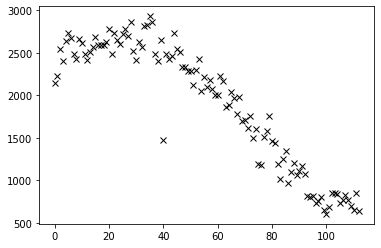

In [8]:
plt.plot(weights, 'kx')

In [10]:
timeArray = []
timeOffset = datetime.strptime("0:00:00.0", '%H:%M:%S.%f')
dataArray1 = []
times = []
errorBars = []
counter = 0
weights = []
path = '/home/nwal/Desktop/gd356_isis/may19/sat/set/'
with open(path+'BTar') as file:
    for line in file:
        line = line.strip('\n')
        filepath = path + line
        hdul = fits.open(filepath)
        typeEx = hdul[0].data
        data = typeEx
        xpoints = np.linspace(3622.6323, 5418.2984, 4099)
        #xpoints = np.linspace(0, 4099, 4099)
        dataStart = find_nearest_id(xpoints, 3680)
        dataFinish = find_nearest_id(xpoints, 3850)
        #print(dataStart,dataFinish)
        dataUn = data[dataStart:dataFinish]
        temp = np.mean(dataUn)
        weights.append(temp)
        hdul.close()

print(weights)

[7944.1147, 9347.711, 2463.4614, 5951.552, 4454.184, 3239.8599, 5320.67, 6662.344, 5987.1484, 3197.2024, 3307.091, 9902.901, 6177.9136, 3179.7764, 5117.8706, 8527.36, 5822.211, 4946.4355, 4703.691, 3925.8406, 6886.1196, 6965.219, 5739.1484, 4370.784, 3250.4438, 2275.1147, 1394.1115, 2154.8992, 12738.109, 2228.8398, 2700.6763, 9648.3, 1803.2202, 2829.0723, 25911.24, 7718.024, 2553.6567, 12277.266, 4516.4785, 4768.2993, 6868.1787, 11382.768, 3207.1892, 6572.1147, 3878.472, 3157.4775, 5757.152, 4476.468, 1782.7717, 1627.1112, 3612.8875, 3492.183, 7156.8804, 1623.7556, 2886.5847, 4653.65, 2602.6921, 6787.423, 3894.2559, 2271.8232, 8446.505, 5572.634, 6502.562, 5829.9985, 5814.6147, 2932.8145, 10320.59, 11086.563, 7233.5503, 3374.9165, 14878.782, 3909.1372, 4175.345, 6485.27, 4519.7573, 4890.9253, 3915.507, 6845.201, 1300.7867, 5188.496, 3358.8337, 9019.372, 4313.698, 1338.7626, 5926.6284, 4894.471, 3065.096, 5389.519, 4317.4644, 10684.647, 6145.3965, 4600.9355, 4692.218, 3558.2168, 7249.82

(0, 15000)

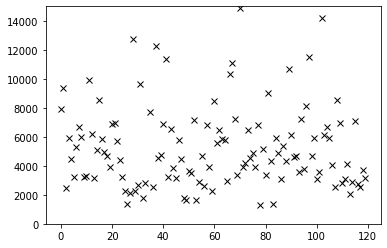

In [13]:
plt.plot(weights, 'kx')
plt.ylim(0,15000)

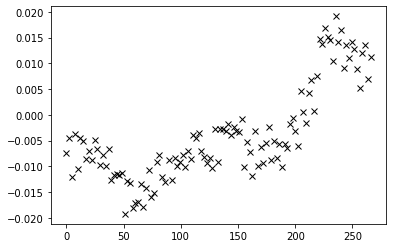

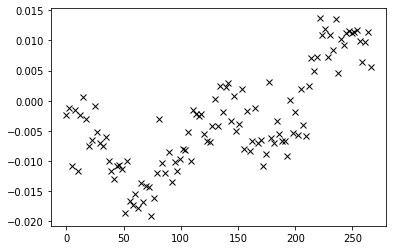

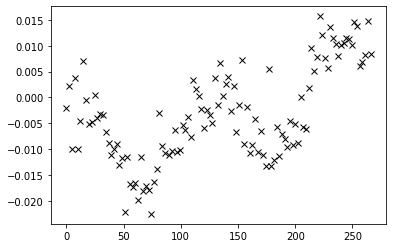

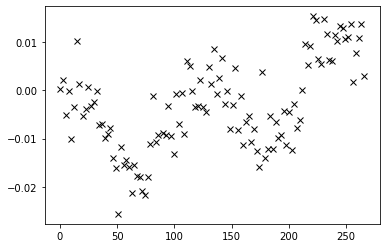

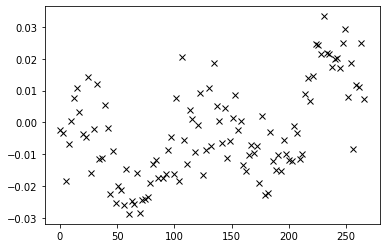

In [198]:
timeArray = []
timeOffset = datetime.strptime("0:00:00.0", '%H:%M:%S.%f')
dataArray1 = []
times = []
errorBars = []
counter = 0
times = [0.0, 2.43, 4.98, 7.65, 9.98, 12.32, 14.65, 17.0, 20.12, 22.45, 24.78, 27.12, 29.47, 32.22, 34.57, 36.9, 39.23, 41.58, 43.92, 46.25, 48.58, 50.93, 53.27, 55.62, 57.95, 60.28, 62.62, 65.0, 67.33, 69.67, 72.02, 74.35, 76.68, 79.03, 81.37, 83.7, 86.03, 90.07, 92.4, 94.73, 97.08, 99.42, 101.75, 104.1, 106.43, 108.77, 111.1, 113.45, 115.78, 118.12, 120.47, 122.8, 125.13, 127.47, 129.82, 132.15, 134.48, 136.83, 139.17, 141.5, 143.83, 146.18, 148.65, 150.98, 153.32, 155.67, 158.0, 160.33, 162.67, 165.02, 167.35, 169.68, 172.03, 174.37, 176.7, 179.03, 181.38, 183.72, 186.05, 188.4, 190.73, 193.07, 195.4, 197.75, 200.08, 202.42, 204.77, 207.22, 209.55, 211.88, 214.23, 216.57, 218.9, 221.23, 223.58, 225.92, 228.25, 230.6, 232.93, 235.27, 237.6, 239.95, 242.28, 244.62, 246.97, 249.3, 251.63, 253.97, 256.32, 258.65, 260.98, 263.33, 265.92]
weights = []
weights2 = []
weights3 = []
weights4 = []
weights5 = []
weights6=[]
bigArray = []
weights7 = []
weightsk = []
stds = []
path = '/home/nwal/Desktop/gd356_isis/jul18/sat/set/'
with open(path+'NormedOffTars') as file:
    for line in file:
        line = line.strip('\n')
        filepath = path + line
        hdul = fits.open(filepath)
        typeEx = hdul[0].data
        data = typeEx
        dataFil = gaussian_filter(data, sigma=2)
        xpoints = np.linspace(4499.43265, 5349.50397, 1941)
        startIn = find_nearest_id(xpoints,4800)
        endIn = find_nearest_id(xpoints,5000)
        toavg = data[startIn:endIn]
        avvg = np.mean(toavg)
        weights.append(avvg)
        
        
        startIn = find_nearest_id(xpoints,4900)
        endIn = find_nearest_id(xpoints,5000)
        toavg = data[startIn:endIn]
        avvg = np.mean(toavg)
        weights2.append(avvg)
        
        startIn = find_nearest_id(xpoints,4800)
        endIn = find_nearest_id(xpoints,4900)
        toavg = data[startIn:endIn]
        avvg = np.mean(toavg)
        weights3.append(avvg)
        
        startIn = find_nearest_id(xpoints,4800)
        endIn = find_nearest_id(xpoints,4870)
        toavg = data[startIn:endIn]
        avvg = np.mean(toavg)
        weights4.append(avvg)
        
        startIn = find_nearest_id(xpoints,4900)
        endIn = find_nearest_id(xpoints,4970)
        toavg = data[startIn:endIn]
        avvg = np.mean(toavg)
        weights5.append(avvg)
        
        startIn = find_nearest_id(xpoints,4800)
        endIn = find_nearest_id(xpoints,4860)
        toavg = data[startIn:endIn]
        avvg = np.mean(toavg)
        weights6.append(avvg)
        
        startIn = find_nearest_id(xpoints,4830)
        endIn = find_nearest_id(xpoints,4845)
        toavg = data[startIn:endIn]
        avvg = np.mean(toavg)
        weightsk.append(avvg)
        
        startIn = find_nearest_id(xpoints,4650)
        endIn = find_nearest_id(xpoints,4750)
        toavg = data[startIn:endIn]
        avvg = np.mean(toavg)
        weights7.append(avvg)
        data1 = data[find_nearest_id(xpoints, 4800):find_nearest_id(xpoints, 4900)]
        if counter == 0:
            bigArray = data1
        else:
            bigArray = np.vstack((bigArray, data1))
        #plt.plot(xpoints, dataFil, color='k', lw='0.2')
        #plt.ylim(-0.1, 0.15)
        #plt.title(line)
        #plt.grid()
        #savepath = path + "pics/" + line + '.png'
        #plt.savefig(savepath, dpi=300)
        #plt.show()
        hdul.close()
        counter = counter+1

plt.plot(times, weights, 'kx')
plt.show()

#rubbish
#plt.plot(times, weights2, 'kx')
#plt.show()

plt.plot(times, weights3, 'kx')
plt.show()

plt.plot(times, weights4, 'kx')
plt.show()

#rubbish
#plt.plot(times, weights5, 'kx')
#plt.show()

plt.plot(times, weights6, 'kx')
plt.show()

#rubbish
#plt.plot(times, weights7, 'kx')
#plt.show()

plt.plot(times, weightsk, 'kx')
plt.show()

In [199]:
print(bigArray)

[[-0.0132767  -0.03389561  0.0271523  ...  0.03596216  0.0695771
  -0.00952065]
 [ 0.02645648  0.05794883  0.00652301 ... -0.01148307 -0.06396908
  -0.01707917]
 [ 0.0060885   0.02157903  0.0854305  ... -0.0409525  -0.03882468
  -0.05349207]
 ...
 [ 0.08100283  0.07585192  0.05411303 ... -0.03145367  0.05187464
   0.04445344]
 [ 0.05792642  0.04848576  0.05890942 ... -0.03366572 -0.02550417
   0.08930796]
 [ 0.00955689 -0.05004573 -0.00956678 ... -0.04709721  0.07032502
   0.15391153]]


120.82600991191676


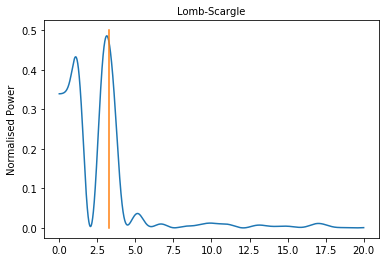

In [203]:
nout = 100000
f = np.linspace(0.0001, 20, nout)
times2 = np.array(times)/60
dataArrayAc = weights4 - np.mean(weights4)
pgram = signal.lombscargle(times2, dataArrayAc, f, normalize=True)
plt.plot(f, pgram)
plt.title("Lomb-Scargle", fontsize=10)
plt.ylabel("Normalised Power")
plt.plot([3.27,3.27], [0,0.5], label=r"$\frac{2\pi}{1.92 \quad Hours}$")
indexMax = np.argmax(pgram)
period = (2*np.pi/f[indexMax])*60
print(period)

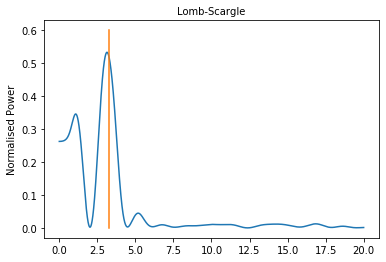

In [58]:
nout = 100000
f = np.linspace(0.0001, 20, nout)
times2 = np.array(times)/60
dataArrayAc = weights6 - np.mean(weights6)
pgram = signal.lombscargle(times2, dataArrayAc, f, normalize=True)
plt.plot(f, pgram)
plt.title("Lomb-Scargle", fontsize=10)
plt.ylabel("Normalised Power")
plt.plot([3.27,3.27], [0,0.6], label=r"$\frac{2\pi}{1.92 \quad Hours}$")

In [28]:
path = '/home/nwal/Desktop/gd356_isis/jul18/sat/set/'
with open(path+'BTarCrop') as file:
    for line in file:
        line = line.strip('\n')
        filepath = path + line
        newlin = 'Normed' + line
        finPath = path + newlin
        shutil.copy(filepath, finPath)

(228, 113)
(228, 113)
(113, 228)


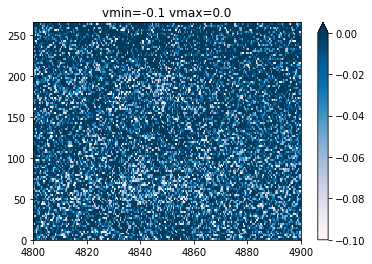

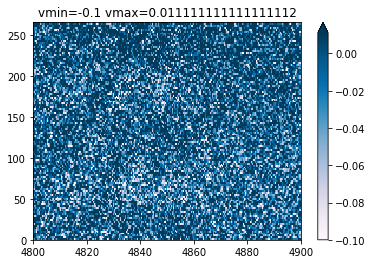

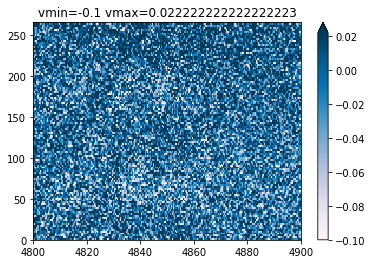

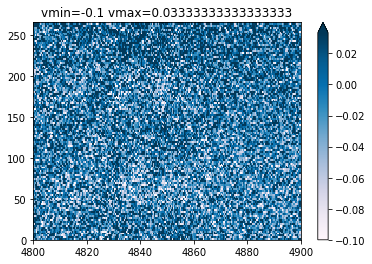

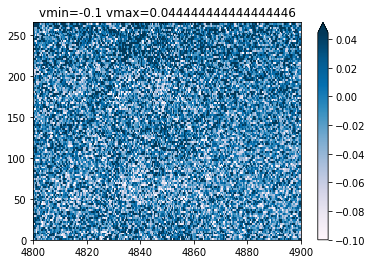

...

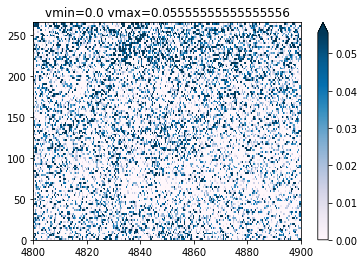

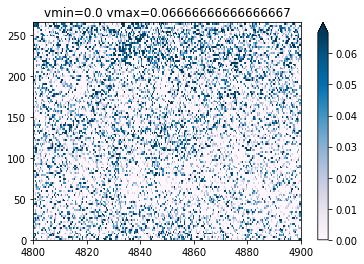

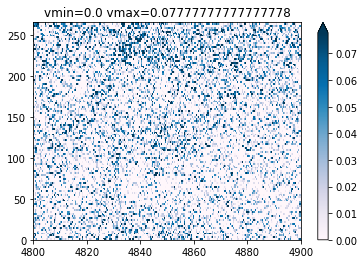

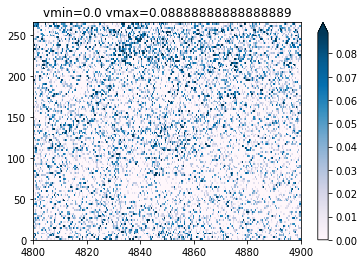

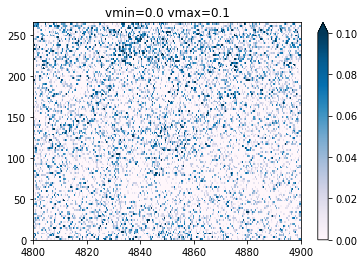

In [91]:
import matplotlib.pyplot as plt
import matplotlib.colors as colors
import matplotlib.cbook as cbook

#N = 100
X, Y = np.mgrid[4800:4900:complex(0, 228), 0:265.92:complex(0, 113)]

# A low hump with a spike coming out of the top right.  Needs to have
# z/colour axis on a log scale so we see both hump and spike.  linear
# scale only shows the spike.
Z = np.transpose(bigArray)
print(np.shape(X))
print(np.shape(Y))
print(np.shape(np.transpose(Z)))



#weights3


vmins = np.linspace(-0.1, 0, 10)
vmaxs = np.linspace(0, 0.1, 10)

for el in vmins:
    for el2 in vmaxs:
        

        pcm = plt.pcolormesh(X, Y, Z, cmap='PuBu') #norm=colors.PowerNorm(gamma=0.5),
                       #cmap='PuBu')
        pcm.set_clim(vmin=el, vmax=el2)
        plt.colorbar(pcm, extend='max')
        plt.title("vmin="+str(el)+" vmax="+str(el2))
        plt.show()
#pcm = ax[1].pcolormesh(X, Y, Z, cmap='PuBu')
#pcm.set_clim(vmin=-0.08, vmax=0.08)
#fig.colorbar(pcm, ax=ax[1], extend='max')
#plt.savefig("/home/nwal/Desktop/trail.png", dpi=600)
#plt.show()






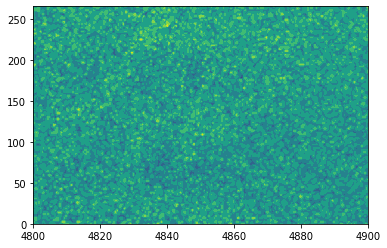

In [102]:
import matplotlib.pyplot as plt
import numpy as np

# Data to plot.


# Mask various z values.


cp = plt.contourf(X, Y, Z)
    # Indicate masked points with red circles.
    #ax.plot(np.ma.array(x, mask=~mask), y, 'ro')

plt.show()

In [108]:
binned_data = binArray(Z, 0, 10, 10, np.sum)
binned_data = binArray(binned_data, 1, 10, 10, np.sum)

In [109]:
print(np.shape(binned_data))

(22, 11)


In [111]:
Xs, Ys = np.mgrid[4800:4900:complex(0, 22), 0:265.92:complex(0, 11)]
print(np.shape(Xs), np.shape(Ys))

(22, 11) (22, 11)


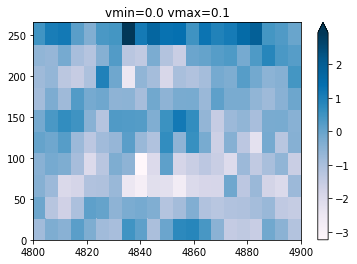

In [112]:
pcm = plt.pcolormesh(Xs, Ys, binned_data, cmap='PuBu') #norm=colors.PowerNorm(gamma=0.5),
                       #cmap='PuBu')

plt.colorbar(pcm, extend='max')
plt.title("vmin="+str(el)+" vmax="+str(el2))
plt.show()

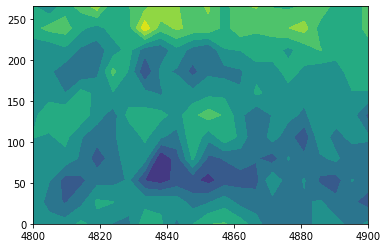

In [115]:
plt.contourf(Xs,Ys,binned_data)

(32, 16) (32, 16)


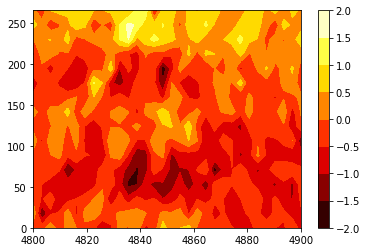

In [124]:
binned_data = binArray(Z, 0, 7, 7, np.sum)
binned_data = binArray(binned_data, 1, 7, 7, np.sum)
end = np.shape(binned_data)[0]
end2 = np.shape(binned_data)[1]
Xs, Ys = np.mgrid[4800:4900:complex(0, end), 0:265.92:complex(0, end2)]
print(np.shape(Xs), np.shape(Ys))
plt.contourf(Xs,Ys,binned_data, cmap='hot')
plt.colorbar()
#plt.savefig('contour.png', dpi=600)

(32, 16) (32, 16)


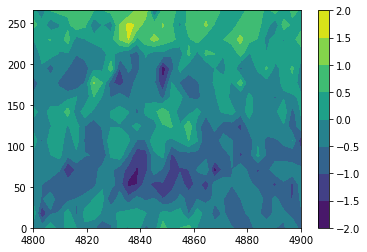

In [125]:
binned_data = binArray(Z, 0, 7, 7, np.sum)
binned_data = binArray(binned_data, 1, 7, 7, np.sum)
end = np.shape(binned_data)[0]
end2 = np.shape(binned_data)[1]
Xs, Ys = np.mgrid[4800:4900:complex(0, end), 0:265.92:complex(0, end2)]
print(np.shape(Xs), np.shape(Ys))
plt.contourf(Xs,Ys,binned_data)
plt.colorbar()
#plt.savefig('contour.png', dpi=600)

(32, 16) (32, 16)


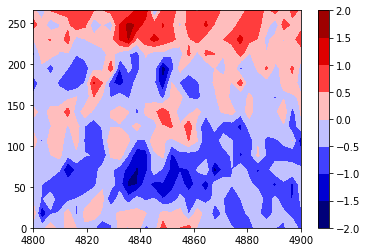

In [127]:
binned_data = binArray(Z, 0, 7, 7, np.sum)
binned_data = binArray(binned_data, 1, 7, 7, np.sum)
end = np.shape(binned_data)[0]
end2 = np.shape(binned_data)[1]
Xs, Ys = np.mgrid[4800:4900:complex(0, end), 0:265.92:complex(0, end2)]
plt.contourf(Xs,Ys,binned_data, cmap='seismic')
plt.colorbar()
plt.savefig('contour.png', dpi=600)

<class 'numpy.ndarray'>


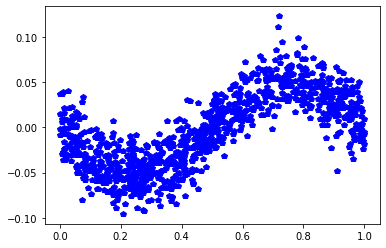

In [132]:
from PyAstronomy.pyasl import foldAt
import matplotlib.pylab as plt
import numpy as np

# Generate some data ...
time = np.random.random(1000) * 100.
flux = 0.05 * np.sin(time*(2.*np.pi/21.5) + 15)
# ... and add some noise
flux += np.random.normal(0, 0.02, len(flux))

# Obtain the phases with respect to some
# reference point (in this case T0=217.4)
phases = foldAt(time, 21.5, T0=217.4)
print(type(time))

# Sort with respect to phase
# First, get the order of indices ...
sortIndi = np.argsort(phases)
# ... and, second, rearrange the arrays.
phases = phases[sortIndi]
flux = flux[sortIndi]

# Plot the result
plt.plot(phases, flux, 'bp')
plt.show()

In [209]:
timeArray = []
timeOffset = datetime.strptime("0:00:00.0", '%H:%M:%S.%f')
dataArray1 = []
times = []
errorBars = []
counter = 0
times = [0.0, 2.43, 4.98, 7.65, 9.98, 12.32, 14.65, 17.0, 20.12, 22.45, 24.78, 27.12, 29.47, 32.22, 34.57, 36.9, 39.23, 41.58, 43.92, 46.25, 48.58, 50.93, 53.27, 55.62, 57.95, 60.28, 62.62, 65.0, 67.33, 69.67, 72.02, 74.35, 76.68, 79.03, 81.37, 83.7, 86.03, 90.07, 92.4, 94.73, 97.08, 99.42, 101.75, 104.1, 106.43, 108.77, 111.1, 113.45, 115.78, 118.12, 120.47, 122.8, 125.13, 127.47, 129.82, 132.15, 134.48, 136.83, 139.17, 141.5, 143.83, 146.18, 148.65, 150.98, 153.32, 155.67, 158.0, 160.33, 162.67, 165.02, 167.35, 169.68, 172.03, 174.37, 176.7, 179.03, 181.38, 183.72, 186.05, 188.4, 190.73, 193.07, 195.4, 197.75, 200.08, 202.42, 204.77, 207.22, 209.55, 211.88, 214.23, 216.57, 218.9, 221.23, 223.58, 225.92, 228.25, 230.6, 232.93, 235.27, 237.6, 239.95, 242.28, 244.62, 246.97, 249.3, 251.63, 253.97, 256.32, 258.65, 260.98, 263.33, 265.92]
times = np.array(times) 
stds = []
path = '/home/nwal/Desktop/gd356_isis/jul18/sat/set/'
with open(path+'NormedOffTars') as file:
    for line in file:
        line = line.strip('\n')
        filepath = path + line
        hdul = fits.open(filepath)
        typeEx = hdul[0].data
        data = typeEx
        dataFil = gaussian_filter(data, sigma=2)
        xpoints = np.linspace(4499.43265, 5349.50397, 1941)
        data1 = data[find_nearest_id(xpoints, 4800):find_nearest_id(xpoints, 4900)]
        if counter == 0:
            bigArray = data1
        else:
            
            bigArray = np.vstack((bigArray, data1))
        #plt.plot(xpoints, dataFil, color='k', lw='0.2')
        #plt.ylim(-0.1, 0.15)
        #plt.title(line)
        #plt.grid()
        #savepath = path + "pics/" + line + '.png'
        #plt.savefig(savepath, dpi=300)
        #plt.show()
        hdul.close()
        counter = counter+1



#phases = foldAt(time, 21.5, T0=217.4)
#print(type(time))

# Sort with respect to phase
# First, get the order of indices ...
#sortIndi = np.argsort(phases)
# ... and, second, rearrange the arrays.
#phases = phases[sortIndi]
#flux = flux[sortIndi]
cnt = 0
for row in np.transpose(bigArray):
    phases = foldAt(times, 120.82600991191676, T0=35)
    sortIndi = np.argsort(phases)
    phases = phases[sortIndi]
    flux = row[sortIndi]
    if cnt ==0:
        bigNewArray = flux
    else:
        bigNewArray = np.vstack((bigNewArray,flux))
    cnt = 1
      

In [210]:
X, Y = np.mgrid[4800:4900:complex(0, 228), 0:1:complex(0, 113)]

# A low hump with a spike coming out of the top right.  Needs to have
# z/colour axis on a log scale so we see both hump and spike.  linear
# scale only shows the spike.
Z = bigNewArray

In [211]:
print(np.shape(Z))
print(np.shape(X))

(228, 113)
(228, 113)


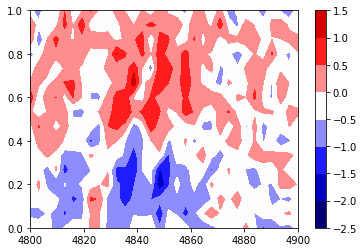

In [214]:
binned_data = binArray(Z, 0, 7, 7, np.sum)
binned_data = binArray(binned_data, 1, 7, 7, np.sum)
end = np.shape(binned_data)[0]
end2 = np.shape(binned_data)[1]
Xs, Ys = np.mgrid[4800:4900:complex(0, end), 0:1:complex(0, end2)]
plt.contourf(Xs,Ys,binned_data, cmap='seismic',vmax=2)
plt.colorbar()
plt.savefig('contourFoldedSugPer.png', dpi=600)

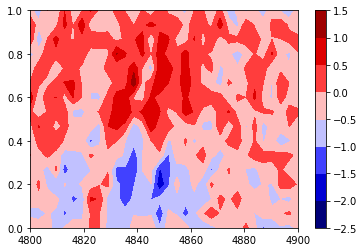

In [213]:
binned_data = binArray(Z, 0, 7, 7, np.sum)
binned_data = binArray(binned_data, 1, 7, 7, np.sum)
end = np.shape(binned_data)[0]
end2 = np.shape(binned_data)[1]
Xs, Ys = np.mgrid[4800:4900:complex(0, end), 0:1:complex(0, end2)]
plt.contourf(Xs,Ys,binned_data, cmap='seismic')
plt.colorbar()
#plt.savefig('contourFolded2.png', dpi=600)

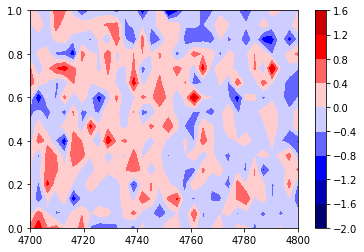

In [217]:
timeArray = []
timeOffset = datetime.strptime("0:00:00.0", '%H:%M:%S.%f')
dataArray1 = []
times = []
errorBars = []
counter = 0
times = [0.0, 2.43, 4.98, 7.65, 9.98, 12.32, 14.65, 17.0, 20.12, 22.45, 24.78, 27.12, 29.47, 32.22, 34.57, 36.9, 39.23, 41.58, 43.92, 46.25, 48.58, 50.93, 53.27, 55.62, 57.95, 60.28, 62.62, 65.0, 67.33, 69.67, 72.02, 74.35, 76.68, 79.03, 81.37, 83.7, 86.03, 90.07, 92.4, 94.73, 97.08, 99.42, 101.75, 104.1, 106.43, 108.77, 111.1, 113.45, 115.78, 118.12, 120.47, 122.8, 125.13, 127.47, 129.82, 132.15, 134.48, 136.83, 139.17, 141.5, 143.83, 146.18, 148.65, 150.98, 153.32, 155.67, 158.0, 160.33, 162.67, 165.02, 167.35, 169.68, 172.03, 174.37, 176.7, 179.03, 181.38, 183.72, 186.05, 188.4, 190.73, 193.07, 195.4, 197.75, 200.08, 202.42, 204.77, 207.22, 209.55, 211.88, 214.23, 216.57, 218.9, 221.23, 223.58, 225.92, 228.25, 230.6, 232.93, 235.27, 237.6, 239.95, 242.28, 244.62, 246.97, 249.3, 251.63, 253.97, 256.32, 258.65, 260.98, 263.33, 265.92]
times = np.array(times) 
stds = []
path = '/home/nwal/Desktop/gd356_isis/jul18/sat/set/'
with open(path+'NormedOffTars') as file:
    for line in file:
        line = line.strip('\n')
        filepath = path + line
        hdul = fits.open(filepath)
        typeEx = hdul[0].data
        data = typeEx
        dataFil = gaussian_filter(data, sigma=2)
        xpoints = np.linspace(4499.43265, 5349.50397, 1941)
        data1 = data[find_nearest_id(xpoints, 4700):find_nearest_id(xpoints, 4800)]
        if counter == 0:
            bigArray = data1
        else:
            
            bigArray = np.vstack((bigArray, data1))
        #plt.plot(xpoints, dataFil, color='k', lw='0.2')
        #plt.ylim(-0.1, 0.15)
        #plt.title(line)
        #plt.grid()
        #savepath = path + "pics/" + line + '.png'
        #plt.savefig(savepath, dpi=300)
        #plt.show()
        hdul.close()
        counter = counter+1



#phases = foldAt(time, 21.5, T0=217.4)
#print(type(time))

# Sort with respect to phase
# First, get the order of indices ...
#sortIndi = np.argsort(phases)
# ... and, second, rearrange the arrays.
#phases = phases[sortIndi]
#flux = flux[sortIndi]
cnt = 0
for row in np.transpose(bigArray):
    phases = foldAt(times, 120.82600991191676, T0=35)
    sortIndi = np.argsort(phases)
    phases = phases[sortIndi]
    flux = row[sortIndi]
    if cnt ==0:
        bigNewArray = flux
    else:
        bigNewArray = np.vstack((bigNewArray,flux))
    cnt = 1
Z = bigNewArray
binned_data = binArray(Z, 0, 7, 7, np.sum)
binned_data = binArray(binned_data, 1, 7, 7, np.sum)
end = np.shape(binned_data)[0]
end2 = np.shape(binned_data)[1]
Xs, Ys = np.mgrid[4700:4800:complex(0, end), 0:1:complex(0, end2)]
plt.contourf(Xs,Ys,binned_data, cmap='seismic',vmax=2)
plt.colorbar()
plt.savefig('RubbishcontourFoldedSugPer.png', dpi=600)

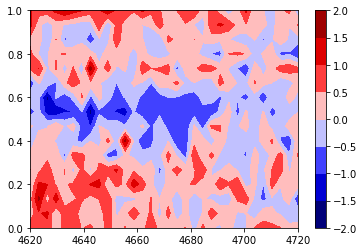

In [221]:
timeArray = []
timeOffset = datetime.strptime("0:00:00.0", '%H:%M:%S.%f')
dataArray1 = []
times = []
errorBars = []
counter = 0
times = [0.0, 2.43, 4.98, 7.65, 9.98, 12.32, 14.65, 17.0, 20.12, 22.45, 24.78, 27.12, 29.47, 32.22, 34.57, 36.9, 39.23, 41.58, 43.92, 46.25, 48.58, 50.93, 53.27, 55.62, 57.95, 60.28, 62.62, 65.0, 67.33, 69.67, 72.02, 74.35, 76.68, 79.03, 81.37, 83.7, 86.03, 90.07, 92.4, 94.73, 97.08, 99.42, 101.75, 104.1, 106.43, 108.77, 111.1, 113.45, 115.78, 118.12, 120.47, 122.8, 125.13, 127.47, 129.82, 132.15, 134.48, 136.83, 139.17, 141.5, 143.83, 146.18, 148.65, 150.98, 153.32, 155.67, 158.0, 160.33, 162.67, 165.02, 167.35, 169.68, 172.03, 174.37, 176.7, 179.03, 181.38, 183.72, 186.05, 188.4, 190.73, 193.07, 195.4, 197.75, 200.08, 202.42, 204.77, 207.22, 209.55, 211.88, 214.23, 216.57, 218.9, 221.23, 223.58, 225.92, 228.25, 230.6, 232.93, 235.27, 237.6, 239.95, 242.28, 244.62, 246.97, 249.3, 251.63, 253.97, 256.32, 258.65, 260.98, 263.33, 265.92]
times = np.array(times) 
stds = []
path = '/home/nwal/Desktop/gd356_isis/jul18/sat/set/'
with open(path+'NormedOffTars') as file:
    for line in file:
        line = line.strip('\n')
        filepath = path + line
        hdul = fits.open(filepath)
        typeEx = hdul[0].data
        data = typeEx
        dataFil = gaussian_filter(data, sigma=2)
        xpoints = np.linspace(4499.43265, 5349.50397, 1941)
        data1 = data[find_nearest_id(xpoints, 4620):find_nearest_id(xpoints, 4720)]
        if counter == 0:
            bigArray = data1
        else:
            
            bigArray = np.vstack((bigArray, data1))
        #plt.plot(xpoints, dataFil, color='k', lw='0.2')
        #plt.ylim(-0.1, 0.15)
        #plt.title(line)
        #plt.grid()
        #savepath = path + "pics/" + line + '.png'
        #plt.savefig(savepath, dpi=300)
        #plt.show()
        hdul.close()
        counter = counter+1



#phases = foldAt(time, 21.5, T0=217.4)
#print(type(time))

# Sort with respect to phase
# First, get the order of indices ...
#sortIndi = np.argsort(phases)
# ... and, second, rearrange the arrays.
#phases = phases[sortIndi]
#flux = flux[sortIndi]
cnt = 0
for row in np.transpose(bigArray):
    phases = foldAt(times, 120.82600991191676, T0=35)
    sortIndi = np.argsort(phases)
    phases = phases[sortIndi]
    flux = row[sortIndi]
    if cnt ==0:
        bigNewArray = flux
    else:
        bigNewArray = np.vstack((bigNewArray,flux))
    cnt = 1
Z = bigNewArray
binned_data = binArray(Z, 0, 7, 7, np.sum)
binned_data = binArray(binned_data, 1, 7, 7, np.sum)
end = np.shape(binned_data)[0]
end2 = np.shape(binned_data)[1]
Xs, Ys = np.mgrid[4620:4720:complex(0, end), 0:1:complex(0, end2)]
plt.contourf(Xs,Ys,binned_data, cmap='seismic',vmax=2)
plt.colorbar()
plt.savefig('Rubbishcontour2FoldedSugPer.png', dpi=600)

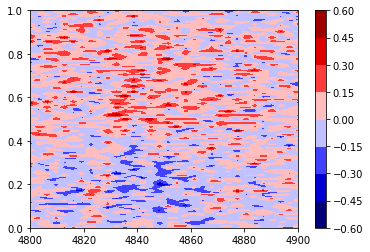

In [226]:
timeArray = []
timeOffset = datetime.strptime("0:00:00.0", '%H:%M:%S.%f')
dataArray1 = []
times = []
errorBars = []
counter = 0
times = [0.0, 2.43, 4.98, 7.65, 9.98, 12.32, 14.65, 17.0, 20.12, 22.45, 24.78, 27.12, 29.47, 32.22, 34.57, 36.9, 39.23, 41.58, 43.92, 46.25, 48.58, 50.93, 53.27, 55.62, 57.95, 60.28, 62.62, 65.0, 67.33, 69.67, 72.02, 74.35, 76.68, 79.03, 81.37, 83.7, 86.03, 90.07, 92.4, 94.73, 97.08, 99.42, 101.75, 104.1, 106.43, 108.77, 111.1, 113.45, 115.78, 118.12, 120.47, 122.8, 125.13, 127.47, 129.82, 132.15, 134.48, 136.83, 139.17, 141.5, 143.83, 146.18, 148.65, 150.98, 153.32, 155.67, 158.0, 160.33, 162.67, 165.02, 167.35, 169.68, 172.03, 174.37, 176.7, 179.03, 181.38, 183.72, 186.05, 188.4, 190.73, 193.07, 195.4, 197.75, 200.08, 202.42, 204.77, 207.22, 209.55, 211.88, 214.23, 216.57, 218.9, 221.23, 223.58, 225.92, 228.25, 230.6, 232.93, 235.27, 237.6, 239.95, 242.28, 244.62, 246.97, 249.3, 251.63, 253.97, 256.32, 258.65, 260.98, 263.33, 265.92]
times = np.array(times) 
stds = []
path = '/home/nwal/Desktop/gd356_isis/jul18/sat/set/'
with open(path+'NormedOffTars') as file:
    for line in file:
        line = line.strip('\n')
        filepath = path + line
        hdul = fits.open(filepath)
        typeEx = hdul[0].data
        data = typeEx
        dataFil = gaussian_filter(data, sigma=2)
        xpoints = np.linspace(4499.43265, 5349.50397, 1941)
        data1 = data[find_nearest_id(xpoints, 4800):find_nearest_id(xpoints, 4900)]
        if counter == 0:
            bigArray = data1
        else:
            
            bigArray = np.vstack((bigArray, data1))
        #plt.plot(xpoints, dataFil, color='k', lw='0.2')
        #plt.ylim(-0.1, 0.15)
        #plt.title(line)
        #plt.grid()
        #savepath = path + "pics/" + line + '.png'
        #plt.savefig(savepath, dpi=300)
        #plt.show()
        hdul.close()
        counter = counter+1



#phases = foldAt(time, 21.5, T0=217.4)
#print(type(time))

# Sort with respect to phase
# First, get the order of indices ...
#sortIndi = np.argsort(phases)
# ... and, second, rearrange the arrays.
#phases = phases[sortIndi]
#flux = flux[sortIndi]
cnt = 0
for row in np.transpose(bigArray):
    phases = foldAt(times, 120.82600991191676, T0=35)
    sortIndi = np.argsort(phases)
    phases = phases[sortIndi]
    flux = row[sortIndi]
    if cnt ==0:
        bigNewArray = flux
    else:
        bigNewArray = np.vstack((bigNewArray,flux))
    cnt = 1
Z = bigNewArray
binned_data = binArray(Z, 0, 7, 7, np.sum)
#binned_data = binArray(binned_data, 1, 7, 7, np.sum)
end = np.shape(binned_data)[0]
end2 = np.shape(binned_data)[1]
Xs, Ys = np.mgrid[4800:4900:complex(0, end), 0:1:complex(0, end2)]
plt.contourf(Xs,Ys,binned_data, cmap='seismic')
plt.colorbar()
plt.savefig('FullTime2FoldedSugPer.png', dpi=600)

# May 19 Blue

In [29]:
timeArray = []
timeOffset = datetime.strptime("0:00:00.0", '%H:%M:%S.%f')
dataArray1 = []
times = []
errorBars = []
counter = 0
weights = []
stds = []
path = '/home/nwal/Desktop/gd356_isis/may19/stan/'
with open(path+'BTarCalCr') as file:
    for line in file:
        line = line.strip('\n')
        filepath = path + line
        hdul = fits.open(filepath)
        typeEx = hdul[0].data
        data = np.array(typeEx)*1000
        
        xpoints = np.linspace(4499.43265, 5349.50397, 1941)
        dataStart = find_nearest_id(xpoints, 5100)
        dataFinish = find_nearest_id(xpoints, 5200)
        
        dataUn = data[dataStart:dataFinish]
        xArrS = find_nearest(xpoints, 5100)
        xArrF = find_nearest(xpoints,5200)
        xArr = np.linspace(xArrS, xArrF, len(dataUn))
        res = np.poly1d(np.polyfit(xArr, dataUn, 1))
        means = func(res, xArr)
        diff = (np.abs(dataUn-means))**2
        summ = np.sqrt((np.sum(diff)/len(dataUn)))
        weights.append(1/(summ**2))
        hdul.close()

print(weights)
with open('/home/nwal/Desktop/gd356_isis/may19/stan/weightsB2', 'w') as f:
    for item in weights:
        f.write("%s\n" % item)

[0.17258152669812712, 0.155194702113662, 0.15453143159872096, 0.14572860769383636, 0.1398164863581487, 0.14017002226974692, 0.12034667442538334, 0.10755845511374348, 0.14211893907243373, 0.12291803634176271, 0.12967768410257477, 0.10294956829630884, 0.12385278297988962, 0.1620829766290545, 0.17240733322546975, 0.16377450317423303, 0.15285058450310998, 0.145524837383601, 0.11124705572086334, 0.11495395799104703, 0.136571096952576, 0.12957183716151086, 0.13524321965903194, 0.11974861014982473, 0.12153304464313783, 0.11582023640863559, 0.12300741213412122, 0.1102676746588214, 0.1274827192371216, 0.09793089851139854, 0.1167277628915182, 0.11659563987784174, 0.10698582884336007, 0.08257002952056829, 0.09864864613116624, 0.08202021535282175, 0.09276281928451897, 0.10439277559548038, 0.10821290393505766, 0.13644024349108713, 0.16626600008026485, 0.12686714906453214, 0.14808338784087835, 0.10308059772972265, 0.1252788946787194, 0.1139377835202402, 0.10598567856158331, 0.13981947644960008, 0.14

In [231]:
xpoints = np.linspace(3622.63, 5462.53, 4200)
dataStart = find_nearest_id(xpoints, 3637.53)
dataFinish = find_nearest_id(xpoints, 5394.61)
print(dataStart, dataFinish)

34 4044


In [4]:
timeArrayMay=[0.0, 2.33, 4.67, 7.02, 9.35, 11.68, 14.02, 16.37, 18.7, 21.03, 23.38, 25.72, 28.05, 30.4, 32.73, 35.07, 37.4, 39.75, 42.08, 44.42, 46.77, 49.1, 51.43, 53.77, 56.12, 58.45, 60.78, 63.13, 65.47, 67.8, 70.15, 72.48, 74.82, 77.15, 79.5, 81.83, 84.17, 86.52, 88.85, 91.18, 93.52, 95.87, 98.2, 100.53, 102.88, 105.22, 107.55, 109.9, 112.23, 114.57, 116.9, 119.25, 121.58, 123.92, 126.27, 128.6, 130.93, 133.27, 135.62, 137.95, 140.28, 142.63, 144.97, 147.3, 149.63, 151.98, 154.32, 156.65, 159.0, 161.33, 163.67, 166.0, 168.35, 170.68, 173.02, 175.37, 177.7, 180.03, 182.38, 184.72, 187.05, 189.38, 191.73, 194.07, 196.4, 198.75, 201.08, 203.42, 205.75, 208.1, 210.43, 212.77, 215.12, 217.45, 219.78, 222.12, 224.47, 226.8, 229.13, 231.48, 233.82, 236.15, 238.48, 240.83, 243.17, 245.5, 247.85, 250.18, 252.52, 254.87, 257.2, 259.53, 261.87, 264.22, 266.55, 268.88, 271.23, 273.57, 275.9, 278.23]

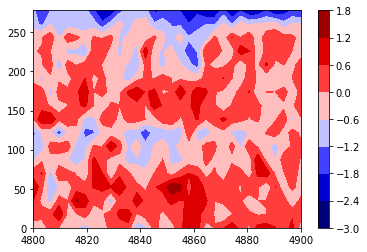

In [33]:
timeArray = []
timeOffset = datetime.strptime("0:00:00.0", '%H:%M:%S.%f')
dataArray1 = []
errorBars = []
counter = 0
times = np.array(timeArrayMay) 
stds = []
path = '/home/nwal/Desktop/gd356_isis/may19/stan/'
with open(path+'BTarCalCrOff') as file:
    for line in file:
        line = line.strip('\n')
        filepath = path + line
        hdul = fits.open(filepath)
        typeEx = hdul[0].data
        data = typeEx
        dataFil = gaussian_filter(data, sigma=2)
        xpoints = np.linspace(4499.43265, 5349.50397, 1941)
        data1 = data[find_nearest_id(xpoints, 4800):find_nearest_id(xpoints, 4900)]
        if counter == 0:
            bigArray = data1
        else:
            
            bigArray = np.vstack((bigArray, data1))
        #plt.plot(xpoints, dataFil, color='k', lw='0.2')
        #plt.ylim(-0.1, 0.15)
        #plt.title(line)
        #plt.grid()
        #savepath = path + "pics/" + line + '.png'
        #plt.savefig(savepath, dpi=300)
        #plt.show()
        hdul.close()
        counter = counter+1



#phases = foldAt(time, 21.5, T0=217.4)
#print(type(time))

# Sort with respect to phase
# First, get the order of indices ...
#sortIndi = np.argsort(phases)
# ... and, second, rearrange the arrays.
#phases = phases[sortIndi]
#flux = flux[sortIndi]
cnt = 0
for row in np.transpose(bigArray):
    phases = foldAt(times, 120, T0=0)
    sortIndi = np.argsort(phases)
    phases = phases[sortIndi]
    flux = row[sortIndi]
    if cnt ==0:
        bigNewArray = flux
    else:
        bigNewArray = np.vstack((bigNewArray,flux))
    cnt = 1
#Z = bigNewArray
Z = np.transpose(bigArray)
binned_data = binArray(Z, 0, 7, 7, np.sum)
binned_data = binArray(binned_data, 1, 7, 7, np.sum)
end = np.shape(binned_data)[0]
end2 = np.shape(binned_data)[1]
#Xs, Ys = np.mgrid[4800:4900:complex(0, end), 0:1:complex(0, end2)]
Xs, Ys = np.mgrid[4800:4900:complex(0, end), 0:278.23:complex(0, end2)]
plt.contourf(Xs,Ys,binned_data, cmap='seismic')
plt.colorbar()
#plt.savefig('FullTime2FoldedSugPer.png', dpi=600)

In [23]:
xpoints = np.linspace(3637.53, 5394.61, 4011)
dataStart = find_nearest_id(xpoints, 4499.43265)
dataFinish = find_nearest_id(xpoints, 5349.50397)
print(dataStart, dataFinish)

1967 3907


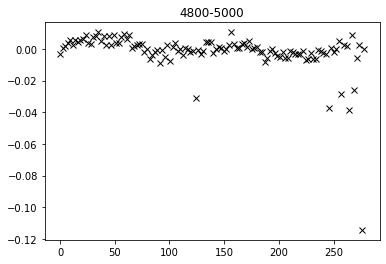

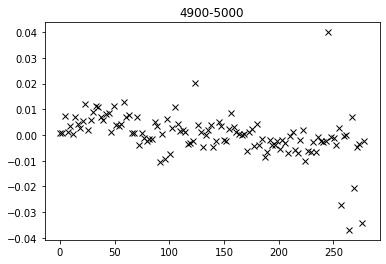

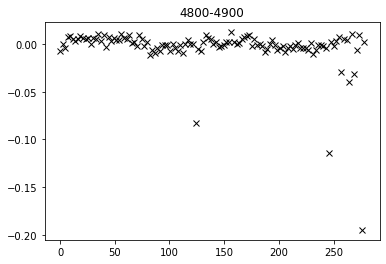

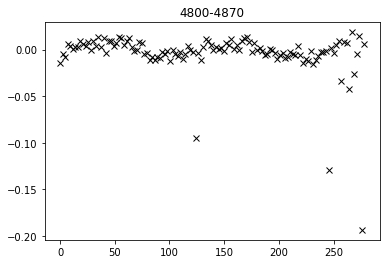

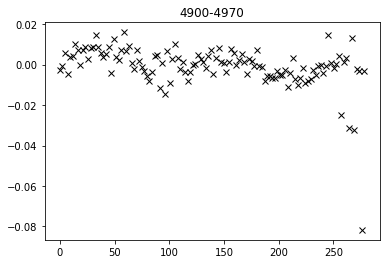

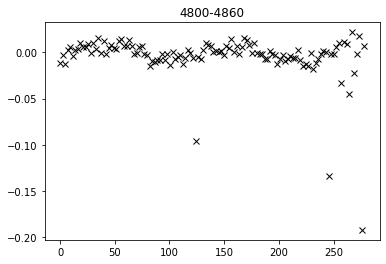

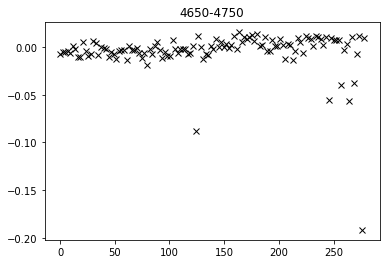

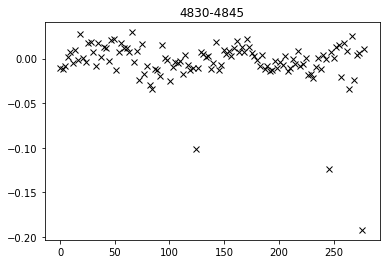

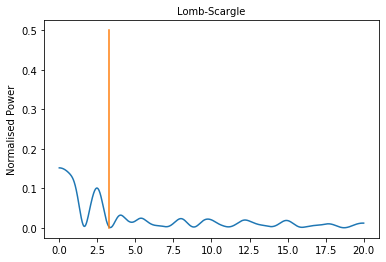

3769911.1843077512


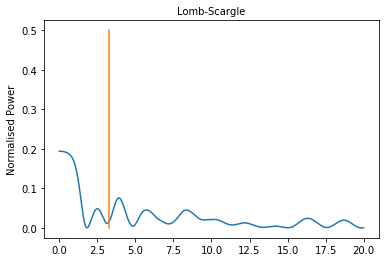

3769911.1843077512


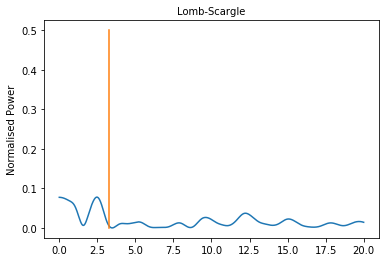

152.63339954738055


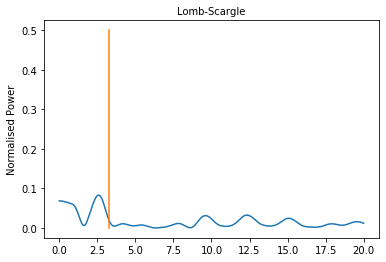

145.82030462177258


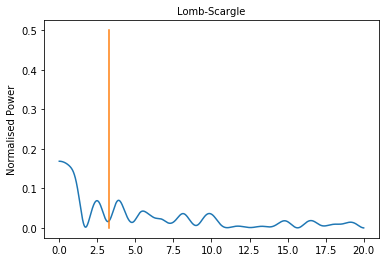

3769911.1843077512


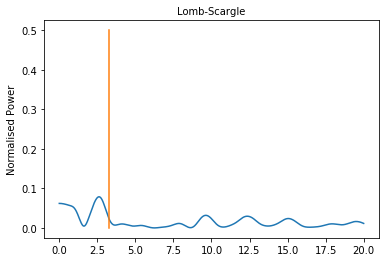

144.42371893574318


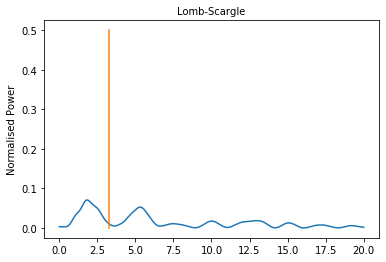

206.51286418461527


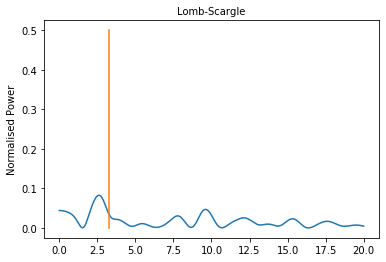

144.60098712671513


In [40]:
timeArray = []
timeOffset = datetime.strptime("0:00:00.0", '%H:%M:%S.%f')
dataArray1 = []
times = []
errorBars = []
counter = 0

times = np.array(timeArrayMay) 

weights1 = []
weights2 = []
weights3 = []
weights4 = []
weights5 = []
weights6=[]
bigArray = []
weights7 = []
weights8 = []
stds = []
path = '/home/nwal/Desktop/gd356_isis/may19/stan/'
with open(path+'BTarCalCrOff') as file:
    for line in file:
        line = line.strip('\n')
        filepath = path + line
        hdul = fits.open(filepath)
        typeEx = hdul[0].data
        data = typeEx
        dataFil = gaussian_filter(data, sigma=2)
        xpoints = np.linspace(4499.43265, 5349.50397, 1941)
        startIn = find_nearest_id(xpoints,4800)
        endIn = find_nearest_id(xpoints,5000)
        toavg = data[startIn:endIn]
        avvg = np.mean(toavg)
        weights1.append(avvg)
        
        
        startIn = find_nearest_id(xpoints,4900)
        endIn = find_nearest_id(xpoints,5000)
        toavg = data[startIn:endIn]
        avvg = np.mean(toavg)
        weights2.append(avvg)
        
        startIn = find_nearest_id(xpoints,4800)
        endIn = find_nearest_id(xpoints,4900)
        toavg = data[startIn:endIn]
        avvg = np.mean(toavg)
        weights3.append(avvg)
        
        startIn = find_nearest_id(xpoints,4800)
        endIn = find_nearest_id(xpoints,4870)
        toavg = data[startIn:endIn]
        avvg = np.mean(toavg)
        weights4.append(avvg)
        
        startIn = find_nearest_id(xpoints,4900)
        endIn = find_nearest_id(xpoints,4970)
        toavg = data[startIn:endIn]
        avvg = np.mean(toavg)
        weights5.append(avvg)
        
        startIn = find_nearest_id(xpoints,4800)
        endIn = find_nearest_id(xpoints,4860)
        toavg = data[startIn:endIn]
        avvg = np.mean(toavg)
        weights6.append(avvg)
        
        
        
        startIn = find_nearest_id(xpoints,4650)
        endIn = find_nearest_id(xpoints,4750)
        toavg = data[startIn:endIn]
        avvg = np.mean(toavg)
        weights7.append(avvg)
        
        startIn = find_nearest_id(xpoints,4830)
        endIn = find_nearest_id(xpoints,4845)
        toavg = data[startIn:endIn]
        avvg = np.mean(toavg)
        weights8.append(avvg)
        
        
        data1 = data[find_nearest_id(xpoints, 4800):find_nearest_id(xpoints, 4900)]
        if counter == 0:
            bigArray = data1
        else:
            bigArray = np.vstack((bigArray, data1))
        #plt.plot(xpoints, dataFil, color='k', lw='0.2')
        #plt.ylim(-0.1, 0.15)
        #plt.title(line)
        #plt.grid()
        #savepath = path + "pics/" + line + '.png'
        #plt.savefig(savepath, dpi=300)
        #plt.show()
        hdul.close()
        counter = counter+1

plt.plot(times, weights1, 'kx')
plt.title('4800-5000')
plt.show()

#rubbish
plt.plot(times, weights2, 'kx')
plt.title('4900-5000')
plt.show()

plt.plot(times, weights3, 'kx')
plt.title('4800-4900')
plt.show()

plt.plot(times, weights4, 'kx')
plt.title('4800-4870')
plt.show()

#rubbish
plt.plot(times, weights5, 'kx')
plt.title('4900-4970')
plt.show()

plt.plot(times, weights6, 'kx')
plt.title('4800-4860')
plt.show()

#rubbish
plt.plot(times, weights7, 'kx')
plt.title('4650-4750')
plt.show()

plt.plot(times, weights8, 'kx')
plt.title('4830-4845')
plt.show()



nout = 100000
f = np.linspace(0.0001, 20, nout)
times2 = np.array(times)/60

weightArr = [weights1,weights2,weights3,weights4,weights5,weights6,weights7,weights8]
for el in weightArr:
    
    dataArrayAc = el - np.mean(el)
    pgram = signal.lombscargle(times2, dataArrayAc, f, normalize=True)
    plt.plot(f, pgram)
    plt.title("Lomb-Scargle", fontsize=10)
    plt.ylabel("Normalised Power")
    plt.plot([3.27,3.27], [0,0.5], label=r"$\frac{2\pi}{1.92 \quad Hours}$")
    plt.show()
    indexMax = np.argmax(pgram)
    period = (2*np.pi/f[indexMax])*60
    print(period)

# Red

In [51]:
timeArray = []
timeOffset = datetime.strptime("0:00:00.0", '%H:%M:%S.%f')
dataArray1 = []
times = []
errorBars = []
counter = 0
weights = []
stds = []
path = '/home/nwal/Desktop/gd356_isis/jul18/sat/set/'
with open(path+'RTar') as file:
    for line in file:
        line = line.strip('\n')
        filepath = path + line
        hdul = fits.open(filepath)
        typeEx = hdul[0].data
        data = typeEx[:, 0]
        data = data[0,:]
        xpoints = np.linspace(5516.0723, 7529.0581, 4096)
        dataStart = find_nearest_id(xpoints, 6000)
        dataFinish = find_nearest_id(xpoints, 6100)
  
        dataUn = data[dataStart:dataFinish]

        xArrS = find_nearest(xpoints, 6000)
        xArrF = find_nearest(xpoints,6100)
        xArr = np.linspace(xArrS, xArrF, len(dataUn))

        res = np.poly1d(np.polyfit(xArr, dataUn, 1))
        means = func(res, xArr)
        diff = (np.abs(dataUn-means))**2
        summ = np.sqrt((np.sum(diff)/len(dataUn)))
        weights.append(1/(summ**2))
        hdul.close()

print(weights)
with open('/home/nwal/Desktop/gd356_isis/jul18/sat/set/RWeight', 'w') as f:
    for item in weights:
        f.write("%s\n" % item)

[0.0022625372836078393, 0.002671703645099192, 0.002077540939711639, 0.0023527494842070667, 0.0026519776178121615, 0.001997105896281224, 0.002411672666167228, 0.001845212328060898, 0.0024399428387609774, 0.0022796166757818865, 0.0023518458381278735, 0.0021230319706244966, 0.002703560657703169, 0.0021801709711157307, 0.002047923181530577, 0.0020316474350419154, 0.002070383429935947, 0.001957814447403015, 0.0016365596642770564, 0.002014553245726333, 0.0021729360587958144, 0.001987435467924627, 0.0018119473227446265, 0.0023202036686874638, 0.0024286581222047613, 0.0020683635036560684, 0.001873893905469359, 0.0017474536469543253, 0.002120855267629108, 0.0023655334154797317, 0.002147739114716478, 0.0020780952207268507, 0.0022135018332773955, 0.0020150460900977877, 0.0023254932346522808, 0.001998725733659601, 0.0017815260291587944, 0.0017969300477737947, 0.0018104760336006354, 0.001956146649036334, 0.0018205745511352723, 0.001569219398315412, 0.0017288890787716317, 0.0014949941112145592, 0.00

In [52]:
xpoints = np.linspace(5516.0723, 7529.0581, 4096)
dataStart = find_nearest_id(xpoints, 5700)
dataFinish = find_nearest_id(xpoints, 7370)
print(dataStart, dataFinish)

374 3771


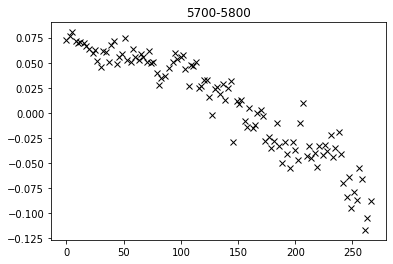

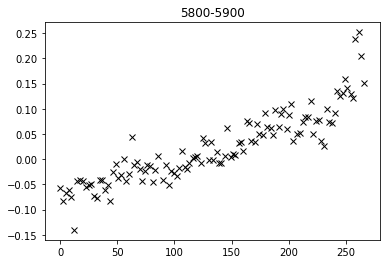

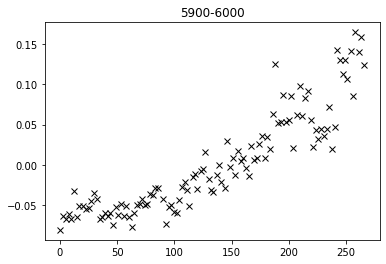

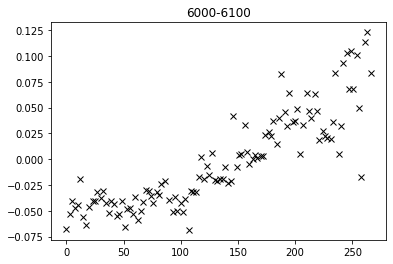

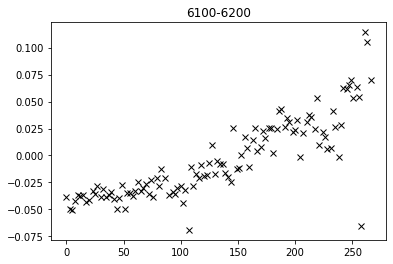

...

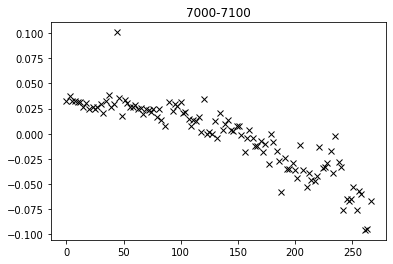

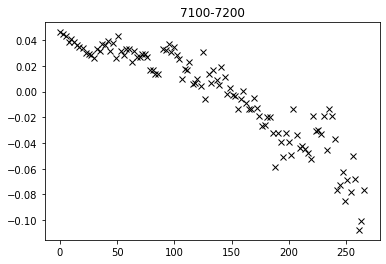

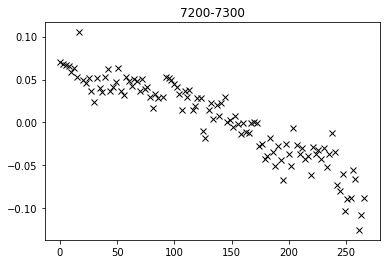

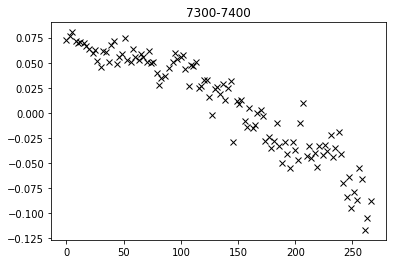

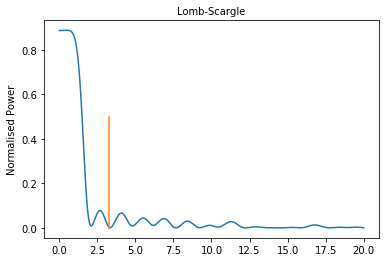

786.5412765679758


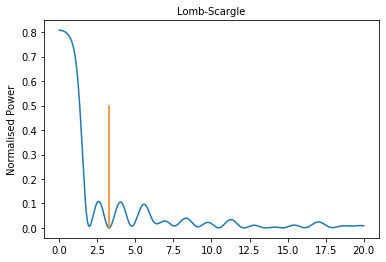

3769911.1843077512


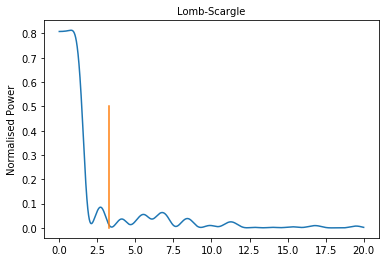

488.8979817276727


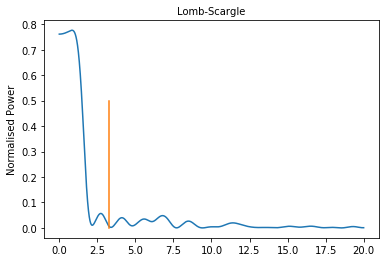

452.18811765845436


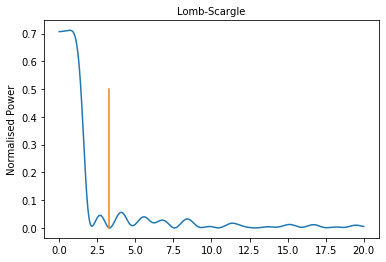

552.3651776438712


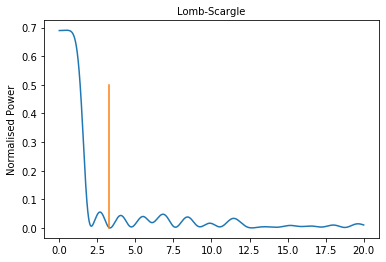

795.8396323911336


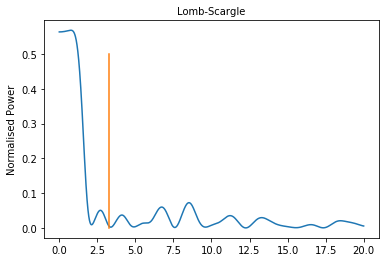

495.1914274443125


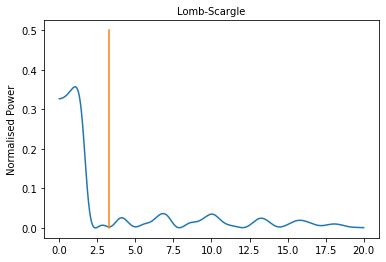

363.7136841752204


In [13]:
https://github.com/deepmind/graph_netstimeArray = []
timeOffset = datetime.strptime("0:00:00.0", '%H:%M:%S.%f')
dataArray1 = []
times = []
errorBars = []
counter = 0



weights1 = []
weights2 = []
weights3 = []
weights4 = []
weights5 = []
weights6 = []
bigArray = []
weights7 = []
weights8 = []
weights9 = []
weights10 = []
weights11 = []
weights12 = []
weights13 = []
weights14 = []
weights15 = []
weights16 = []
weights17 = []
stds = []




path = '/home/nwal/Desktop/gd356_isis/jul18/sat/set/'
with open(path+'RTarCrOff') as file:
    for line in file:
        line = line.strip('\n')
        filepath = path + line
        hdul = fits.open(filepath)
        timeStart = hdul[0].header['UTOBS']
        timeStart = datetime.strptime(timeStart, '%H:%M:%S.%f')
        if timeStart.hour < 21:
            timeStart = timeStart.replace(day=2)
        delta = total_seconds(timeStart)
        delta = (delta - 75900.5)/60
        delta = np.round(delta, 2)
        timeArray.append(delta)
        typeEx = hdul[0].data
        data = typeEx
        dataFil = gaussian_filter(data, sigma=2)
        xpoints = np.linspace(5699.9201, 7369.7889, 3398)
        startIn = find_nearest_id(xpoints,7200)
        endIn = find_nearest_id(xpoints,7300)
        toavg = data[startIn:endIn]
        avvg = np.mean(toavg)
        weights1.append(avvg)
        
        
        startIn = find_nearest_id(xpoints,5700)
        endIn = find_nearest_id(xpoints,5800)
        toavg = data[startIn:endIn]
        avvg = np.mean(toavg)
        weights2.append(avvg)
        
        startIn = find_nearest_id(xpoints,5800)
        endIn = find_nearest_id(xpoints,5900)
        toavg = data[startIn:endIn]
        avvg = np.mean(toavg)
        weights3.append(avvg)
        
        startIn = find_nearest_id(xpoints,5900)
        endIn = find_nearest_id(xpoints,6000)
        toavg = data[startIn:endIn]
        avvg = np.mean(toavg)
        weights4.append(avvg)
        
        startIn = find_nearest_id(xpoints,6000)
        endIn = find_nearest_id(xpoints,6100)
        toavg = data[startIn:endIn]
        avvg = np.mean(toavg)
        weights5.append(avvg)
        
        startIn = find_nearest_id(xpoints,6100)
        endIn = find_nearest_id(xpoints,6200)
        toavg = data[startIn:endIn]
        avvg = np.mean(toavg)
        weights6.append(avvg)
        
        
        
        startIn = find_nearest_id(xpoints,6200)
        endIn = find_nearest_id(xpoints,6300)
        toavg = data[startIn:endIn]
        avvg = np.mean(toavg)
        weights7.append(avvg)
        
        startIn = find_nearest_id(xpoints,6300)
        endIn = find_nearest_id(xpoints,6400)
        toavg = data[startIn:endIn]
        avvg = np.mean(toavg)
        weights8.append(avvg)
        
        startIn = find_nearest_id(xpoints,6400)
        endIn = find_nearest_id(xpoints,6500)
        toavg = data[startIn:endIn]
        avvg = np.mean(toavg)
        weights9.append(avvg)
        
        startIn = find_nearest_id(xpoints,6500)
        endIn = find_nearest_id(xpoints,6600)
        toavg = data[startIn:endIn]
        avvg = np.mean(toavg)
        weights10.append(avvg)
        
        startIn = find_nearest_id(xpoints,6600)
        endIn = find_nearest_id(xpoints,6700)
        toavg = data[startIn:endIn]
        avvg = np.mean(toavg)
        weights11.append(avvg)
        
        startIn = find_nearest_id(xpoints,6700)
        endIn = find_nearest_id(xpoints,6800)
        toavg = data[startIn:endIn]
        avvg = np.mean(toavg)
        weights12.append(avvg)
        
        startIn = find_nearest_id(xpoints,6800)
        endIn = find_nearest_id(xpoints,6900)
        toavg = data[startIn:endIn]
        avvg = np.mean(toavg)
        weights13.append(avvg)
        
        startIn = find_nearest_id(xpoints,6900)
        endIn = find_nearest_id(xpoints,7000)
        toavg = data[startIn:endIn]
        avvg = np.mean(toavg)
        weights14.append(avvg)
        
        startIn = find_nearest_id(xpoints,7000)
        endIn = find_nearest_id(xpoints,7100)
        toavg = data[startIn:endIn]
        avvg = np.mean(toavg)
        weights15.append(avvg)
        
        startIn = find_nearest_id(xpoints,7100)
        endIn = find_nearest_id(xpoints,7200)
        toavg = data[startIn:endIn]
        avvg = np.mean(toavg)
        weights16.append(avvg)
        
        startIn = find_nearest_id(xpoints,7200)
        endIn = find_nearest_id(xpoints,7300)
        toavg = data[startIn:endIn]
        avvg = np.mean(toavg)
        weights17.append(avvg)
        
        
        data1 = data[find_nearest_id(xpoints, 4800):find_nearest_id(xpoints, 4900)]
        if counter == 0:
            bigArray = data1
        else:
            bigArray = np.vstack((bigArray, data1))
        #plt.plot(xpoints, dataFil, color='k', lw='0.2')
        #plt.ylim(-0.1, 0.15)
        #plt.title(line)
        #plt.grid()
        #savepath = path + "pics/" + line + '.png'
        #plt.savefig(savepath, dpi=300)
        #plt.show()
        hdul.close()
        counter = counter+1
times=timeArray
plt.plot(times, weights1, 'kx')
plt.title('5700-5800')
plt.show()

#rubbish
plt.plot(times, weights2, 'kx')
plt.title('5800-5900')
plt.show()

plt.plot(times, weights3, 'kx')
plt.title('5900-6000')
plt.show()

plt.plot(times, weights4, 'kx')
plt.title('6000-6100')
plt.show()

#rubbish
plt.plot(times, weights5, 'kx')
plt.title('6100-6200')
plt.show()

plt.plot(times, weights6, 'kx')
plt.title('6200-6300')
plt.show()

#rubbish
plt.plot(times, weights7, 'kx')
plt.title('6300-6400')
plt.show()

plt.plot(times, weights8, 'kx')
plt.title('6400-6500')
plt.show()



plt.plot(times, weights9, 'kx')
plt.title('6500-6600')
plt.show()
plt.plot(times, weights10, 'kx')
plt.title('6600-6700')
plt.show()
plt.plot(times, weights11, 'kx')
plt.title('6700-6800')
plt.show()
plt.plot(times, weights12, 'kx')
plt.title('6800-6900')
plt.show()
plt.plot(times, weights13, 'kx')
plt.title('6900-7000')
plt.show()
plt.plot(times, weights14, 'kx')
plt.title('7000-7100')
plt.show()
plt.plot(times, weights15, 'kx')
plt.title('7100-7200')
plt.show()
plt.plot(times, weights16, 'kx')
plt.title('7200-7300')
plt.show()
plt.plot(times, weights17, 'kx')
plt.title('7300-7400')
plt.show()



nout = 100000
f = np.linspace(0.0001, 20, nout)
times2 = np.array(times)/60

weightArr = [weights1,weights2,weights3,weights4,weights5,weights6,weights7,weights8]
for el in weightArr:
    
    dataArrayAc = el - np.mean(el)
    pgram = signal.lombscargle(times2, dataArrayAc, f, normalize=True)
    plt.plot(f, pgram)
    plt.title("Lomb-Scargle", fontsize=10)
    plt.ylabel("Normalised Power")
    plt.plot([3.27,3.27], [0,0.5], label=r"$\frac{2\pi}{1.92 \quad Hours}$")
    plt.show()
    indexMax = np.argmax(pgram)
    period = (2*np.pi/f[indexMax])*60
    print(period)

In [14]:
from shutil import copyfile
fromPath = '/home/nwal/Desktop/gd356_isis/jul18/sat/set/'
toPath = '/home/nwal/Desktop/gd356_isis/jul18/sat2/'
with open(fromPath+'BTarsToCopy') as file:
    for line in file:
        line = line.strip('\n')
        filepathFrom = fromPath + line
        filepathTo = toPath + line
        copyfile(filepathFrom, filepathTo)

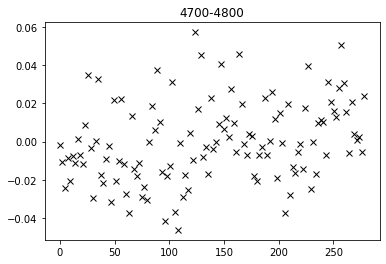

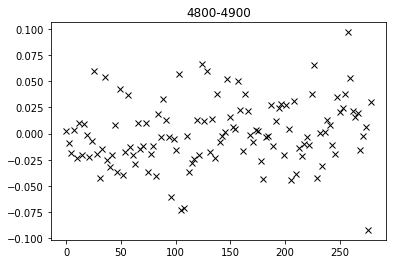

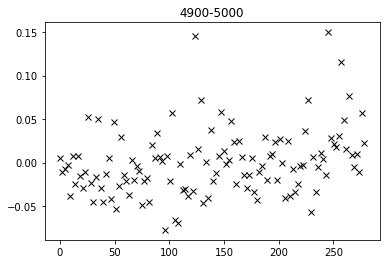

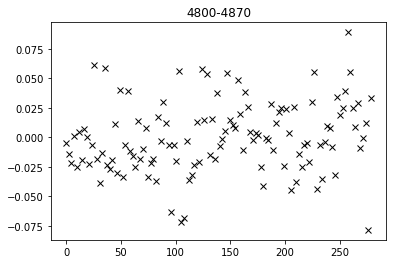

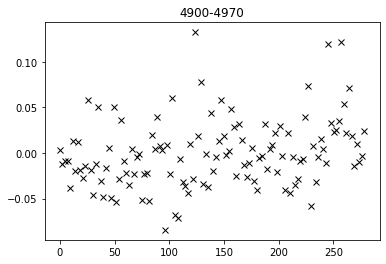

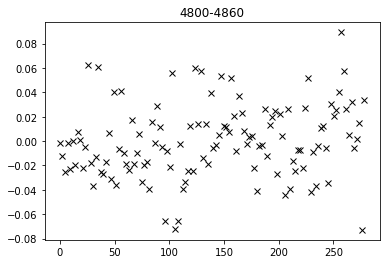

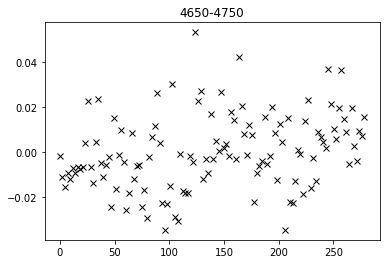

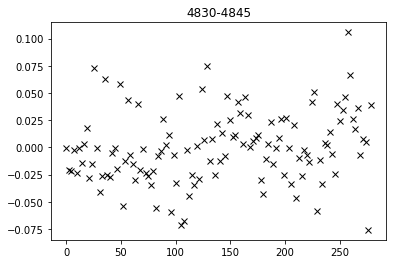

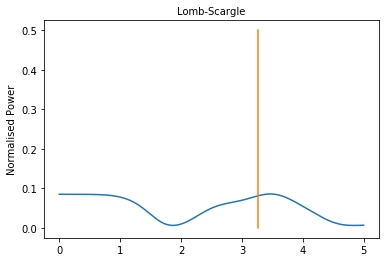

108.73963809937189


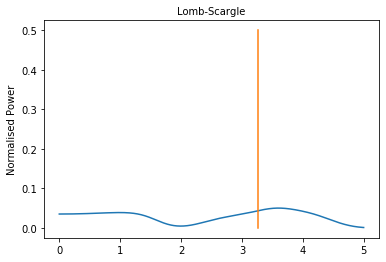

104.68736051335539


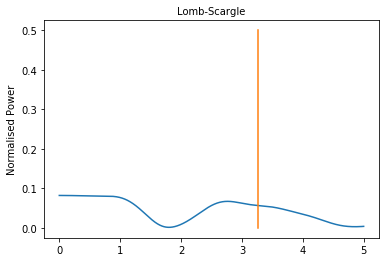

3769911.1843077512


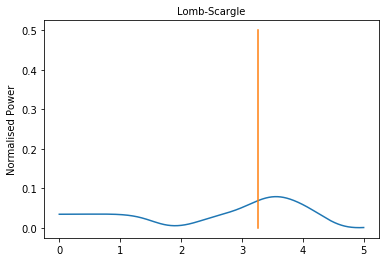

105.90041526769197


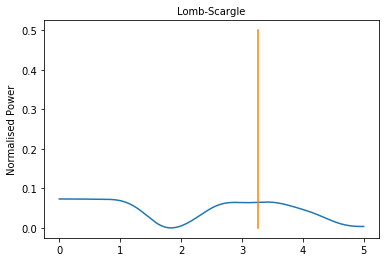

3769911.1843077512


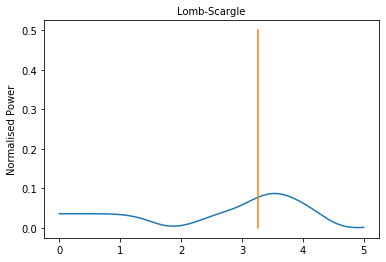

106.56496828752921


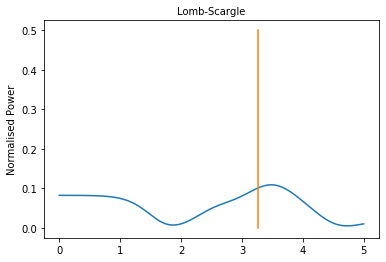

108.25254147366282


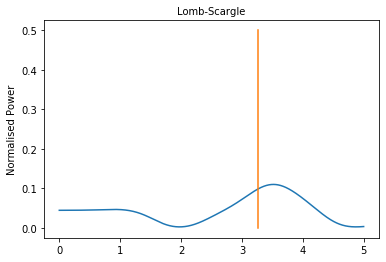

107.1678004179286


In [21]:
https://github.com/deepmind/graph_nets
timeArray = []
timeOffset = datetime.strptime("0:00:00.0", '%H:%M:%S.%f')
dataArray1 = []
times = []
errorBars = []
counter = 0
timeArrayMay=[0.0, 2.33, 4.67, 7.02, 9.35, 11.68, 14.02, 16.37, 18.7, 21.03, 23.38, 25.72, 28.05, 30.4, 32.73, 35.07, 37.4, 39.75, 42.08, 44.42, 46.77, 49.1, 51.43, 53.77, 56.12, 58.45, 60.78, 63.13, 65.47, 67.8, 70.15, 72.48, 74.82, 77.15, 79.5, 81.83, 84.17, 86.52, 88.85, 91.18, 93.52, 95.87, 98.2, 100.53, 102.88, 105.22, 107.55, 109.9, 112.23, 114.57, 116.9, 119.25, 121.58, 123.92, 126.27, 128.6, 130.93, 133.27, 135.62, 137.95, 140.28, 142.63, 144.97, 147.3, 149.63, 151.98, 154.32, 156.65, 159.0, 161.33, 163.67, 166.0, 168.35, 170.68, 173.02, 175.37, 177.7, 180.03, 182.38, 184.72, 187.05, 189.38, 191.73, 194.07, 196.4, 198.75, 201.08, 203.42, 205.75, 208.1, 210.43, 212.77, 215.12, 217.45, 219.78, 222.12, 224.47, 226.8, 229.13, 231.48, 233.82, 236.15, 238.48, 240.83, 243.17, 245.5, 247.85, 250.18, 252.52, 254.87, 257.2, 259.53, 261.87, 264.22, 266.55, 268.88, 271.23, 273.57, 275.9, 278.23]
times = np.array(timeArrayMay) 

weights1 = []
weights2 = []
weights3 = []
weights4 = []
weights5 = []
weights6=[]
bigArray = []
weights7 = []
weights8 = []
stds = []
path = '/home/nwal/Desktop/gd356_isis/may19/sat2/'
with open(path+'BTarConOff') as file:
    for line in file:
        line = line.strip('\n')
        filepath = path + line
        hdul = fits.open(filepath)
        typeEx = hdul[0].data
        data = typeEx
        dataFil = gaussian_filter(data, sigma=2)
        xpoints = np.linspace(3637.5303, 5394.6140, 4011)
        startIn = find_nearest_id(xpoints,4700)
        endIn = find_nearest_id(xpoints,4800)
        toavg = data[startIn:endIn]
        avvg = np.mean(toavg)
        weights1.append(avvg)
        
        
        startIn = find_nearest_id(xpoints,4800)
        endIn = find_nearest_id(xpoints,4900)
        toavg = data[startIn:endIn]
        avvg = np.mean(toavg)
        weights2.append(avvg)
        
        startIn = find_nearest_id(xpoints,4900)
        endIn = find_nearest_id(xpoints,5000)
        toavg = data[startIn:endIn]
        avvg = np.mean(toavg)
        weights3.append(avvg)
        
        startIn = find_nearest_id(xpoints,4800)
        endIn = find_nearest_id(xpoints,4870)
        toavg = data[startIn:endIn]
        avvg = np.mean(toavg)
        weights4.append(avvg)
        
        startIn = find_nearest_id(xpoints,4900)
        endIn = find_nearest_id(xpoints,4970)
        toavg = data[startIn:endIn]
        avvg = np.mean(toavg)
        weights5.append(avvg)
        
        startIn = find_nearest_id(xpoints,4800)
        endIn = find_nearest_id(xpoints,4860)
        toavg = data[startIn:endIn]
        avvg = np.mean(toavg)
        weights6.append(avvg)
        
        
        
        startIn = find_nearest_id(xpoints,4650)
        endIn = find_nearest_id(xpoints,4750)
        toavg = data[startIn:endIn]
        avvg = np.mean(toavg)
        weights7.append(avvg)
        
        startIn = find_nearest_id(xpoints,4830)
        endIn = find_nearest_id(xpoints,4845)
        toavg = data[startIn:endIn]
        avvg = np.mean(toavg)
        weights8.append(avvg)
        
        
        data1 = data[find_nearest_id(xpoints, 4800):find_nearest_id(xpoints, 4900)]
        if counter == 0:
            bigArray = data1
        else:
            bigArray = np.vstack((bigArray, data1))
        #plt.plot(xpoints, dataFil, color='k', lw='0.2')
        #plt.ylim(-0.1, 0.15)
        #plt.title(line)
        #plt.grid()
        #savepath = path + "pics/" + line + '.png'
        #plt.savefig(savepath, dpi=300)
        #plt.show()
        hdul.close()
        counter = counter+1

plt.plot(times, weights1, 'kx')
plt.title('4700-4800')
plt.show()

#rubbish
plt.plot(times, weights2, 'kx')
plt.title('4800-4900')
plt.show()

plt.plot(times, weights3, 'kx')
plt.title('4900-5000')
plt.show()

plt.plot(times, weights4, 'kx')
plt.title('4800-4870')
plt.show()

#rubbish
plt.plot(times, weights5, 'kx')
plt.title('4900-4970')
plt.show()

plt.plot(times, weights6, 'kx')
plt.title('4800-4860')
plt.show()

#rubbish
plt.plot(times, weights7, 'kx')
plt.title('4650-4750')
plt.show()

plt.plot(times, weights8, 'kx')
plt.title('4830-4845')
plt.show()



nout = 100000
f = np.linspace(0.0001, 5, nout)
times2 = np.array(times)/60

weightArr = [weights1,weights2,weights3,weights4,weights5,weights6,weights7,weights8]
for el in weightArr:
    
    dataArrayAc = el - np.mean(el)
    pgram = signal.lombscargle(times2, dataArrayAc, f, normalize=True)
    plt.plot(f, pgram)
    plt.title("Lomb-Scargle", fontsize=10)
    plt.ylabel("Normalised Power")
    plt.plot([3.27,3.27], [0,0.5], label=r"$\frac{2\pi}{1.92 \quad Hours}$")
    plt.show()
    indexMax = np.argmax(pgram)data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAYIAAAEICAYAAABS0fM3AAAABHNCSVQICAgIfAhkiAAAAAlwSFlzAAALEgAACxIB0t1+/AAAADh0RVh0U29mdHdhcmUAbWF0cGxvdGxpYiB2ZXJzaW9uMy4xLjEsIGh0dHA6Ly9tYXRwbG90bGliLm9yZy8QZhcZAAAfJUlEQVR4nO3df5AkZ33f8ffXd5a4O3SXO52gFEnHSUSuyslVCGlXRhATJmeDTqkgEsSUID6EE9eVB1xJCisXqZQ9yG455VvqZMqAx2BQFZaMpbFjYlUlslCyg/NHYjEr5SR0FiedhEA/EJIKgkGYENCTP6bn1Dvbs9Mz0z+ep/vzqpra2Z6e6aene57P8zzd02POOUREpL5+puwCiIhIuRQEIiI1pyAQEak5BYGISM0pCEREak5BICJScwoCEZGaUxBIZZnZxWb2IzO7PfrfzOxmM/ummf2Nmd1hZttj859pZrdGjz1nZh8eer39ZvY1M/uhmXXN7HUbLPttZvaymf0gdrs+9vguM/uimb1kZt8ws/cNPf990fSXzOw/m9mutM8VmZSCQKrsU0Av9v/7gYPAW4C/C2wBPhF7/KPAxcDrgAZw2MyuAjCz3cCfAQvALmAVuHPM8p91zr06dvv8UNl+DLwW+OdA28wuiZZ1CfDpqKyvBX4I/F6a54pMw/TNYqkiM7sO+GfAXwN/zzn3K2b2p8B9zrmPRfO8GVgBdjnnfmhmzwC/6pz7UvT4EnCxc+46MzsEfMA59+bosW3Ai8AbnXNfS1j+24DbnXPnJzy2Dfgu8PPOuUejabcBzzjnbjSz/wjsdc69L3rs9cAjwNnAyxs9N4O3TmpIPQKpnGi4ZxH4zeGHolv8/zOBi81sJ/1ewoOxxx8EBi3tS+KPOedeAh6PPZ7kNWb2bTP7upn9ThQAAD8H/HRQkadY1uP0ewA/l+K5IhNTEEgVLQGfc849NTT9buDXzGyvme0A/l00fSvw6uj+92Lzfw84K7r/6qHHhh8f9jXgUuBc4B8BlwO3pHytjR6ftBwiYykIpFLM7FLgl4DfSXj4VuCPgS8DJ4BuNP1p4AfR/e2x+bcD34/u/2DosdOPm9kvxg4InwBwzj3nnPtr59zLzrmvA4eBa8e9VorHxz1XZGKbyy6ASMbeBuwFvmlm0G9BbzKzfc65y4CPRDfM7O3AM/TH1182s28BbwDujV7rDfQDg+hv/KyfbcDrgRPRMYJBj2IUxyvDUo8Cm83sYufcYyOW9YbYsi6iP4T1KP1jBBs9V2RiOlgslWJmW1nbYr6BfjC0gJ8CO4EngL8PdIDfdc59JnrubwNXAu+if0ZOl/7B478ws3OAU8C/AP4L8B+Af+ice9OIcrwtWs5TwPnAHwJPOud+NXr8Dvrh8Gv0h5D+K/Bm59yJ6Ayg/wX8Y+AB+mcQbXbOXTfuudO+b1JvGhqSSnHO/TAalnnOOfcc/aGUHznnXgB20680X6J/vODWQQhEPkL/APA3gL8EPuac+4vodV8A3g38Fv2zdn4BuG6DolxGvzJ/CfifwMPAv4o9/kH6p68+T3+4qjWoyKO/vw78UfT4WdH8Y58rMg31CEREak49AhGRmlMQiIjUnIJARKTmFAQiIjUX5PcIdu/e7fbu3Vt2MUREgnL//fe/6Jw7Z3h6kEGwd+9eVldXyy6GiEhQzOwbSdM1NCQiUnMKAhGRmlMQiIjUnIJARKTmFAQiIjWXSRCY2VVmdtLMTpnZup/LM7O3mtkDZvYTM7t26LGfmtnx6HZXFuUREZnW8vIy3W53zbRut8vy8nJJJcrfzEFgZpvo/5j2AWAf8F4z2zc02zeBDwBfSHiJv3XOXRrd3jlreUREZjE/P0+z2TwdBt1ul2azyfz8fMkly08W3yO4AjjlnHsCTl8r/Rr6PxoOgHPuyeixlzNYnohIbhqNBp1Oh2azSavVot1u0+l0aDQaZRctN1kMDZ1H/8c3Bp6OpqX1KjNbNbO/MrN3jZrJzA5F862+8MIL05ZVRGSsRqNBq9ViaWmJVqtV6RCAbILAEqZN8iMHe5xzc8D7gI+b2euTZnLOfcY5N+ecmzvnnHXfkBaZSh3Hg2W8brdLu91mYWGBdru9bh+pmiyC4Gnggtj/5wPPpn2yc+7Z6O8T9H9U/I0ZlEkklTqOB8vGBvtAp9NhcXHx9DBRlcMgiyDoAReb2YVmdgb9n+9LdfaPme00szOj+7uBtxA7tiCSt/h48JEjR05XAFUfCpDRer3emn1gsI/0er2SS5afTH6q0syuBj4ObKL/O7C/ZWaLwKpz7i4zmwe+SP+Hw38EPOecu8TM3kz/h7lfph9KH3fOfW7c8ubm5pwuOidZOnLkCEtLSywsLLC4uFh2cURyYWb3R0Pxa6eH+JvFCgLJ0mAooC5niEh9jQoCfbNYaq2O48EiwxQEUmt1HA8WGaahIRGRmtDQkIiIJFIQiIjUnIJARKTmFAQiIjWnIBARqTkFgYhIzSkIRERqTkEgIlJzCgIRkZpTEIiI1JyCQESk5hQEIiI1pyAQEak5BYGISM0pCEREak5BICJScwoCEZGaUxCIiNScgkBEZEbLy8t0u90107rdLsvLyyWVaDIKAhGRGc3Pz9NsNk+HQbfbpdlsMj8/X3LJ0tlcdgFERELXaDTodDo0m01arRbtdptOp0Oj0Si7aKmoRyAikoFGo0Gr1WJpaYlWqxVMCICCQEQkE91ul3a7zcLCAu12e90xA58pCEREZjQ4JtDpdFhcXDw9TBRKGCgIRERm1Ov11hwTGBwz6PV6JZcsHXPOlV2Gic3NzbnV1dWyiyEiEhQzu985Nzc8XT0CEZGaUxCIiNScgkBEpOYUBCIiNacgEBGpuUyCwMyuMrOTZnbKzG5MePytZvaAmf3EzK4deux6M3ssul2fRXlERCS9mYPAzDYBnwIOAPuA95rZvqHZvgl8APjC0HN3AR8BfgG4AviIme2ctUwiIpJeFj2CK4BTzrknnHM/Bu4AronP4Jx70jn3EPDy0HPfAdzrnPuOc+67wL3AVRmUSUREUsoiCM4Dnor9/3Q0Le/niohIBrIIAkuYlvbryqmfa2aHzGzVzFZfeOGF1IUTEZGNZREETwMXxP4/H3g26+c65z7jnJtzzs2dc845UxVURETWyyIIesDFZnahmZ0BXAfclfK59wBvN7Od0UHit0fTRESkIDMHgXPuJ8Bv0K/AHwE6zrkTZrZoZu8EMLN5M3saeA/waTM7ET33O8AS/TDpAYvRNBERKYiuPioiUhO6+qiIiCRSEIiI1JyCQESk5hQEIiI1pyAQEak5BYGISM0pCEREak5BICJScwoCEZGaUxCIiNScgkBEpOYUBCIiNacgEBHJ2fLyMt1ud820brfL8vJySSVaS0EgIpKz+fl5ms3m6TDodrs0m03m5+dLLlnf5rILICJSdY1Gg06nQ7PZpNVq0W636XQ6NBqNsosGqEcgIlKIRqNBq9ViaWmJVqvlTQiAgkAkke9juvKKULZVt9ul3W6zsLBAu91eV+YyKQhEEvg+piuvCGFbDcrU6XRYXFw8PUzkTRg454K7XX755U4kbysrK2737t1uYWHB7d69262srJRdJBnB92119OjRdWVaWVlxR48eLbQcwKpLqFNLr9SnuSkIpCgLCwsOcAsLC2UXRcbQthpvVBBoaEhkBJ/HdGUtbasZJaWD7zf1CCRvg6GGQXd++H/xh7ZVeqhHIJJer9dbc5734DzwXq9XcslkmLbV7KwfEmGZm5tzq6urZRdDRCQoZna/c25ueLp6BCIiNacgEBGpOQWBiEjNKQhERGpOQSBSgFCuhyP1pCAQ71WhEg3hejjilyL3ewWBeK8KlWj8evRHjhw5fQEyny5FLH4pdL9P+paZ7zd9s7h+fL+oWFq6Ho5MIuv9Hl10TkIXeiValTCTYmW53ysICuTLJWerJPRKVNfDkWmoRxBwEOhDn60qvJ9qHMik8tjvcw0C4CrgJHAKuDHh8TOBO6PH7wP2RtP3An8LHI9uv59meb4HgXPpklyVQzp6n6SO8tjvcwsCYBPwOHARcAbwILBvaJ4PDip54DrgTvdKEDw86TJDCALnxo/tVaGlKyJr+dxwyTMIrgTuif1/E3DT0Dz3AFdG9zcDLwJW5SBIO7YX+ti3ZMvnSkTS8bmBl2cQXAt8Nvb/QeCTQ/M8DJwf+/9xYHcUBC8B/xv4S+AXN1jOIWAVWN2zZ0/e79dMJt0Rpj0rQJVG9fhciUh6vjbw8gyC9yQEwSeG5jmREARnR8cOzo6mXQ48BWwft0zfewSTVNCz7DCqNKrJ10pEJuPj6c5eDg0lvNaXgblxy/Q9CNLKoiJXpVFNPlYikp6vn8s8g2Az8ARwYexg8SVD83xo6GBxJ7p/DrApun8R8Aywa9wyqxIEWQ3tqNKoFl8rEUnH5556bkHQf22uBh6NhnxujqYtAu+M7r8K+BP6p49+Bbgomv7uaNjoQeAB4J+kWV5VgiALqjSqxedKRNLx+djdqCDQbxYHbHARqsHFy4b/l/AsLy8zPz+/Zvt1u116vR6HDx8usWRSBaN+s1hBEDBVGiIyCQWBiEjNjQoC/R6ByAyq8KM5IgoCkRlU4UdzQqQAzpaCQGQG+uWxciiAs6UgkEJUuQXXaDRotVosLS3RarUUAgVQAGdLQSCFqHILrtvt0m63WVhYoN1urws8yYcCOENJXy7w/aYvlIWpil9+0xfAylPF/SlvjPhCmXoEUpgqtuB6vd6aIYnBkEWv1yu5ZNUW//Lk4uLi6WGiontjlRnyTEoH32/qEYzn49fc1YILh4/7T5wv5QutR4h+s7hefNtBfSuPbEzbqy9N4ITUwFEQ1JBPO6gvLThJb9r9p0rbOm0ghnIFYAVBTYWyg4qfptl/qtabGBeIPjW4xlEQ1FBIO6ikU2RrO4tfz0t6bog9hlGBGFroKQhqJrQdVNZLqjCPHTvmtm3blvt2Tbv/bFSpV6XyrFKoKQhqJrQdVNYbVWEeO3Ys955e2v1n2jKG0lv1IbSy/CwrCEQCNKrC9OnYz3AZByFQhQOs8Up4cD9eCRfRuMoyjBQEUhj1RrI1XGH62JqOl7Fqp1wOlNk7yOr9UhBIYXzoTlfFtK3tMss4riwh7x9lBlgWPSgFgRQqxBafb5IqzK1bt7pjx46tm6+s3tY0lXroPcb9+/evq5DzLr96BAqCYIUwBuyzECrMEMqYpZWVFbd9+3a3detWt3379tPHDPJs7OgYgYIgWCH2COpWqclk4hXwysqK27Fjh9uyZYvbsWNH4v6d1f6ks4YUBEEKdQw41HJLMYYr5EGPd//+/Ynz+7g/KQikMCG3rIvoyYT8/khf2v3Et56xgkAkpbyPbfjYUpT0Jt1+Ph0rUxCIpFBUC863lmLdzNIrm+S5vm1nBYHIGEW31H1qKU6iCkNbRWzrSZZR1HuqIJDaG/dhC+XKnmWrytBW3ttg1P504MCBddOLupiggmBCSRvx0KFD7tChQ2umhdYS8l2elXEZFViZVxDNWnxdBmU+ePDgmnUJTRm9slH7YREXE1QQTChpY23fvn3NOcOhfIB9s1Fln3dlXXRLPGl9svp2cNFDNMPrcvDgQQe4gwcP5rK8Wfh+vaNRy847mGodBNN+YJI2Vlk7T6jjstO0iPN+j4tuBea1PmlDM8t9J94TMDN38OBBLxtD494bH4a3yriYYK2DYJaNnlRp+NSd9O0DOGzabnBe73FZQV7m+mS97wz3BHzdFzd6bwbhODzcFZ9eZNmKuphgrYPAuekqAJ96BKPKk4W8exuTdoPLbkFnLc36zLIN0oRMVu/pYGhruCfga+903HtTxj6R53DhOLUPAucma5UlbSwfjhHk0bIs4sOQ1A1OqlDyPJBaxvBa2vd22m0wSQU/674TWq807XtTdOOuzGHeXIMAuAo4CZwCbkx4/Ezgzujx+4C9scduiqafBN6RZnlF9Ah8PGsozx22yNcedIOT/vp2meW4aT7AeX75aJKKOYvtG9JxqklDK9TvdEwqtyAANgGPAxcBZwAPAvuG5vkg8PvR/euAO6P7+6L5zwQujF5n07hlFnmMwBdltNqzMK4bPHg8hNMQfdsGs/6ucJVbviF/+zdPeQbBlcA9sf9vAm4amuce4Mro/mbgRcCG543Pt9GtqLOGfFLWOP6s0pR71gAK9Ytgw+VeWelf2nj//v1BHQMaJYQGWAhlzFKeQXAt8NnY/weBTw7N8zBwfuz/x4HdwCeBX4lN/xxw7bhlZv09gioExSzK/DBkUbEWXf6sek7xcg5CoKgfOylK1g2MrD+rdfvs5xkE70kIgk8MzXMiIQjOBj6VEATvHrGcQ8AqsLpnz55M35y6tQqGlXU8JMv3vajufdbLGbze/v37T4dA/LEiK6S8KsUse3yD9+vYsWOJX0CUjdV6aCiNOo0TplFEOGZd8YR6+WhfDlTmsX559PiOHTs21ZfZfGv9l1GePINgM/BEdLB3cLD4kqF5PjR0sLgT3b9k6GDxE3kcLE7Llw+kL0IKxyLKmscH17f3OMvy5NnjG3ypbZLPqm89/zLKk1sQ9F+bq4FHoyGfm6Npi8A7o/uvAv6E/mmiXwEuij335uh5J4EDaZaXRRAUdaAudCGEo28f8LR8LXdW23yS4JzkpIJBT2CasKpy8KaRaxAUfcsiCOpwoG5Wvn1oRvGty5+Wj+Uua5uPC8XB/4NrHA2ffjxJOX1r3BRZHgVBAp8O1Plm8N4cOnRoXTjW/b2pqrJ7KKNCKF6Oo0ePJl6XJ+3+6FvjRj2CEoIgqQU2zVhj2tcOucIcrM9wABw6dMiLD5BkI77fxrf5YL8teh9Oah1n9dkqO+jSlCfvb9YrCFx2Zx+kee2yd7Is+daK8l1IjQKf9tu89zPftksZP1qkIIhkOdY46rV9/fLMLHwbV/WZT5VrGj4EfWjvWZ7y3B4Kgpj42QdxWVSyWVaYWX04Zg0UHyqK0BT5nmXxhcCyg96HRo8PZRjIa3soCCJZfEBH7TCD8fMsP/xZlHeWQFFLbXpFVa5J22iSS6Yr6Pt82dfVI8g5CLLa0LN+8CZteWRRoUy7c/nUSgpJ0ZVr0vLSlMGXys8XZYdi3ttDQeDy+e3WwQ4zOM0yzWtPsrGz3DHzaKEqKNYrq3JN2r7jtrm233plDpPlvT0UBDmYZYcpurWWV0tHLcr1yvwlNF9+VjVUVX/PFAQZy2KHKaq1lraynnZ5Vf/w+G7WocqNpN0nqtCzqEOjRkGQoSx2mCIrz8GHdPhyvvHp8TJNExhZfTFv3HJ8rVx8+zWurC4jnnafqEIlGtL+Ni0FQYayOh2z6A9NmuVOM2SV5RfzJi2vL0Iq66TSNlrUM/SfgqAkZf3oyyhpPqxpjn0MXiePL+ZNWl5fhFTWSaU9Hlb29xFkYwqCKYXa+t/IRh/WSSqzPL+Yl7a8vqnimVll9QjKXu8qUhBMKbTjAbOUZZJ1LWqdfHrvxsmrrGU2Jso8RuBjIyp0CoIZZPEBL6pVu1EratwHK20LrKgPaEgVQd5lLSsQyz5rKKSGQAgUBDPK+zsDWdmoQsrqw1pUlz2koYEiyhrSEFmW6rreeVAQzGCjinxcBZC2pZjnt57Vigpf2m0aUnimoX05WwqCKY2ryH0dbql7K6pKFeI0x25CGE4bp0rr4gsFwZTSVChZtVp8e50QVfGX1SYNtaps/yqFuS8UBDnLqgU+6+vUvRU1HAA7duxwW7ZsWXO5BeeqX8nUvUcoyRQEOfKpJV/1Ci6N+Pu4ZcuWxAqxyoE5aj8KYd/Io4whrHdRFAQ5yapCqXLFVIZBi3jr1q0jg7UqQyhxG+1HIexjeZQxhPUuioIgJ6GdklkHKyv9q29u3brVbd++PbESHKjaEEras9h8Dr88yhjCehdBQSBrVDV4Bh/4wQ8FDbeI8zjIH5oQwi+PMoaw3nlTEKRQ1coxSVW7y2kv8nfs2DG3bdu2yq3/OD6FX2i//V0FCoIUqlo5jlKXD0fSdt26devpK6bG56ti6A/4tn8nlSerH9QZt5wq7+8bURCkVJfKcaAu3eUst2uoPUfffjwnqfU/yW9/z7ps37dXHhQEE/C5ctSlKKaX1XZVC3NyG71nPn/eqkZBkJLvlaNOV51O1tvV9/1knDJayUnvWejvY2gUBCmEUjlm8eGpU3c5r+0acku2rH09/p6F8nmrEgVBCnlWjllf1923SsjnYMmjbFVoyRa9DsPLy+N4gGxMQVCytK2fNPP5WAlVtXWXFCJVOvW0qAZFVfeP0CgIPJC2At9oPp8/UD4G1KyS3u+qnHpa5PbyucdYJwoCT6RtgY2az8dTAOPL9m3IKgt1CbiqrJuMlksQALuAe4HHor87R8x3fTTPY8D1selfBk4Cx6Pba9IsN9QgyKJHUKZxlYev5c5C1QJOLfR6yisIloEbo/s3AkcT5tkFPBH93Rnd3+leCYK5SZcbYhBkeYygTKMqe9/LPYsqB5zUS15BcBI4N7p/LnAyYZ73Ap+O/f9p4L2uZkGQ9VlDZUpqHYdQ7mlUOeCkfvIKgv8z9P93E+a5Afj3sf8XgBvcK0Hw1WhYaAGwDZZ1CFgFVvfs2ZPvuxWYIivhurWOqxpwUk9TBwHw34CHE27XpAyCf5sQBL8Z3T8v+nsW8CXg/ePK4wLtEeSpqFarWsciYRsVBD/DGM65X3LO/XzC7c+Bb5vZuQDR3+cTXuJp4ILY/+cDz0av/Uz09/vAF4ArxpVH1ms0GnQ6HZrNJkeOHKHZbNLpdGg0Gpkup9frrXndwXJ7vV6myxGRgiWlQ9ob8DHWHixeTphnF/B1+geKd0b3dwGbgd3RPD8L/Cnw62mWqx5Bsqqd2SIyKQ3lbYxpewRj/Dbwy2b2GPDL0f+Y2ZyZfTYKmu8AS0Avui1G084E7jGzh+gfI3gG+IMZy1Nb3W6XdrvNwsIC7XabbrdbdpFECjc/P0+z2Ty9/3e7XZrNJvPz8yWXzHNJ6eD7TT2CtTR2L/KKup3QMAly6hGIBzR2L/KKRqNBq9ViaWmJVquV+bGyKrJ+SIRlbm7Ora6ull0MEfHQYDio1WrRbrdzOXEiVGZ2v3Nubni6egQiUhmDEOh0OiwuLp4+m07HzDamIBCRytAw6XQ0NCQiUhMaGpJKWF5eXtfN73a7LC8vl1QikfApCCQoOk9cJHubyy6AyCTil9PQWSEi2VCPQIITP0/8wIEDa0JAw0Qik1MQSHAGl9M4ePAgt99+O7fccsvp6RomEpmchoYkKPHzxBuNBpdeeik33HADx48f5+6779YwkcgUFAQSlOHzxD/84Q9z/PhxbrvtNhYWFhQCIlPQ0JAE5fDhw+uOCdx999266qrIDBQEEixdTkAkGwoCCZYuJyCSDV1iQrywvLzM/Pz8umGfXq/H4cOHSyyZSHXoEhPiNX1jWKQ8OmtIvKBvDIuURz0C8YZ+WUqkHAoC8cbgG8M6FVSkWAoC8YJOBRUpj4JAvKBTQUXKo9NHRURqQqePiohIIgWBiEjNKQhERGpOQSAiUnMKAhGRmgvyrCEzewH4xpRP3w28mGFxfFLVdavqeoHWLUQhr9frnHPnDE8MMghmYWarSadPVUFV162q6wVatxBVcb00NCQiUnMKAhGRmqtjEHym7ALkqKrrVtX1Aq1biCq3XrU7RiAiImvVsUcgIiIxCgIRkZqrTRCY2VVmdtLMTpnZjWWXZ1Zm9qSZfdXMjpvZajRtl5nda2aPRX93ll3ONMzsVjN73swejk1LXBfr+91oOz5kZpeVV/LxRqzbR83smWjbHTezq2OP3RSt20kze0c5pR7PzC4ws66ZPWJmJ8zsX0fTg99uG6xb8NttJOdc5W/AJuBx4CLgDOBBYF/Z5ZpxnZ4Edg9NWwZujO7fCBwtu5wp1+WtwGXAw+PWBbgauBsw4E3AfWWXf4p1+yhwQ8K8+6J980zgwmif3VT2OoxYr3OBy6L7ZwGPRuUPfrttsG7Bb7dRt7r0CK4ATjnnnnDO/Ri4A7im5DLl4Rrg89H9zwPvKrEsqTnn/gfwnaHJo9blGuAPXd9fAX/HzM4tpqSTG7Fuo1wD3OGc+7/Oua8Dp+jvu95xzn3LOfdAdP/7wCPAeVRgu22wbqMEs91GqUsQnAc8Ffv/aTbesCFwwJfM7H4zOxRNe61z7lvQ35mB15RWutmNWpeqbMvfiIZIbo0N4QW5bma2F3gjcB8V225D6wYV2m5xdQkCS5gW+nmzb3HOXQYcAD5kZm8tu0AFqcK2bAOvBy4FvgUci6YHt25m9mrgPwH/xjn3NxvNmjAttHWrzHYbVpcgeBq4IPb/+cCzJZUlE865Z6O/zwNfpN8V/fagux39fb68Es5s1LoEvy2dc992zv3UOfcy8Ae8MowQ1LqZ2c/Sryj/yDn3Z9HkSmy3pHWrynZLUpcg6AEXm9mFZnYGcB1wV8llmpqZbTOzswb3gbcDD9Nfp+uj2a4H/rycEmZi1LrcBbw/OgvlTcD3BkMRoRgaG/+n9Lcd9NftOjM708wuBC4GvlJ0+dIwMwM+BzzinLsl9lDw223UulVhu41U9tHqom70z1p4lP4R/ZvLLs+M63IR/bMUHgRODNYHOBv478Bj0d9dZZc15fr8Mf2u9v+j37r6l6PWhX43/FPRdvwqMFd2+adYt9uisj9EvxI5Nzb/zdG6nQQOlF3+DdbrH9Af/ngIOB7drq7Cdttg3YLfbqNuusSEiEjN1WVoSERERlAQiIjUnIJARKTmFAQiIjWnIBARqTkFgYhIzSkIRERq7v8D/yPpXgwkeGwAAAAASUVORK5CYII=
    period = (2*np.pi/f[indexMax])*60
    print(period)

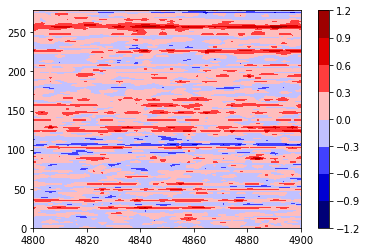

In [23]:
timeArray = []
timeOffset = datetime.strptime("0:00:00.0", '%H:%M:%S.%f')
dataArray1 = []
errorBars = []
counter = 0
times = np.array(timeArrayMay) 
stds = []
path = '/home/nwal/Desktop/gd356_isis/may19/sat2/'
with open(path+'BTarConOff') as file:
    for line in file:
        line = line.strip('\n')
        filepath = path + line
        hdul = fits.open(filepath)
        typeEx = hdul[0].data
        data = typeEx
        dataFil = gaussian_filter(data, sigma=2)
        xpoints = np.linspace(3637.5303, 5394.6140, 4011)
        data1 = data[find_nearest_id(xpoints, 4800):find_nearest_id(xpoints, 4900)]
        if counter == 0:
            bigArray = data1
        else:
            
            bigArray = np.vstack((bigArray, data1))
        #plt.plot(xpoints, dataFil, color='k', lw='0.2')
        #plt.ylim(-0.1, 0.15)
        #plt.title(line)
        #plt.grid()
        #savepath = path + "pics/" + line + '.png'
        #plt.savefig(savepath, dpi=300)
        #plt.show()
        hdul.close()
        counter = counter+1



#phases = foldAt(time, 21.5, T0=217.4)
#print(type(time))

# Sort with respect to phase
# First, get the order of indices ...
#sortIndi = np.argsort(phases)
# ... and, second, rearrange the arrays.
#phases = phases[sortIndi]
#flux = flux[sortIndi]
cnt = 0
for row in np.transpose(bigArray):
    phases = foldAt(times, 120, T0=0)
    sortIndi = np.argsort(phases)
    phases = phases[sortIndi]
    flux = row[sortIndi]
    if cnt ==0:
        bigNewArray = flux
    else:
        bigNewArray = np.vstack((bigNewArray,flux))
    cnt = 1
#Z = bigNewArray
Z = np.transpose(bigArray)
binned_data = binArray(Z, 0, 7, 7, np.sum)
#binned_data = binArray(binned_data, 1, 7, 7, np.sum)
end = np.shape(binned_data)[0]
end2 = np.shape(binned_data)[1]
#Xs, Ys = np.mgrid[4800:4900:complex(0, end), 0:1:complex(0, end2)]
Xs, Ys = np.mgrid[4800:4900:complex(0, end), 0:278.23:complex(0, end2)]
plt.contourf(Xs,Ys,binned_data, cmap='seismic')
plt.colorbar()
#plt.savefig('FullTime2FoldedSugPer.png', dpi=600)

In [24]:
xpoints = np.linspace(3637.5303, 5394.6140, 4011)
dataStart = find_nearest_id(xpoints, 4680)
dataFinish = find_nearest_id(xpoints, 4900)
print(dataStart, dataFinish)

2379 2881


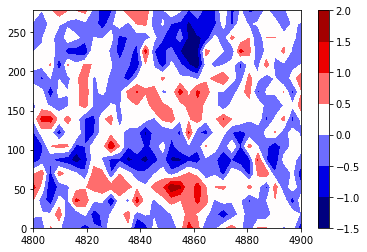

In [27]:
timeArray = []
timeOffset = datetime.strptime("0:00:00.0", '%H:%M:%S.%f')
dataArray1 = []
errorBars = []
counter = 0
times = np.array(timeArrayMay) 
stds = []
path = '/home/nwal/Desktop/gd356_isis/may19/sat2/'
with open(path+'BTarCropConOff') as file:
    for line in file:
        line = line.strip('\n')
        filepath = path + line
        hdul = fits.open(filepath)
        typeEx = hdul[0].data
        data = typeEx
        dataFil = gaussian_filter(data, sigma=2)
        xpoints = np.linspace(4679.9498, 4899.4757, 502)
        data1 = data[find_nearest_id(xpoints, 4800):find_nearest_id(xpoints, 4900)]
        if counter == 0:
            bigArray = data1
        else:
            
            bigArray = np.vstack((bigArray, data1))
        #plt.plot(xpoints, dataFil, color='k', lw='0.2')
        #plt.ylim(-0.1, 0.15)
        #plt.title(line)
        #plt.grid()
        #savepath = path + "pics/" + line + '.png'
        #plt.savefig(savepath, dpi=300)
        #plt.show()
        hdul.close()
        counter = counter+1



#phases = foldAt(time, 21.5, T0=217.4)
#print(type(time))

# Sort with respect to phase
# First, get the order of indices ...
#sortIndi = np.argsort(phases)
# ... and, second, rearrange the arrays.
#phases = phases[sortIndi]
#flux = flux[sortIndi]
cnt = 0
for row in np.transpose(bigArray):
    phases = foldAt(times, 120, T0=0)
    sortIndi = np.argsort(phases)
    phases = phases[sortIndi]
    flux = row[sortIndi]
    if cnt ==0:
        bigNewArray = flux
    else:
        bigNewArray = np.vstack((bigNewArray,flux))
    cnt = 1
#Z = bigNewArray
Z = np.transpose(bigArray)
binned_data = binArray(Z, 0, 7, 7, np.sum)
binned_data = binArray(binned_data, 1, 7, 7, np.sum)
end = np.shape(binned_data)[0]
end2 = np.shape(binned_data)[1]
#Xs, Ys = np.mgrid[4800:4900:complex(0, end), 0:1:complex(0, end2)]
Xs, Ys = np.mgrid[4800:4900:complex(0, end), 0:278.23:complex(0, end2)]
plt.contourf(Xs,Ys,binned_data, cmap='seismic')
plt.colorbar()
#plt.savefig('FullTime2FoldedSugPer.png', dpi=600)

/home/nwal/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/home/nwal/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in true_divide
  ret = ret.dtype.type(ret / rcount)


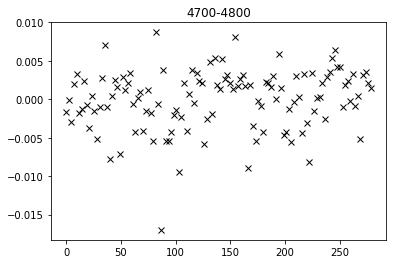

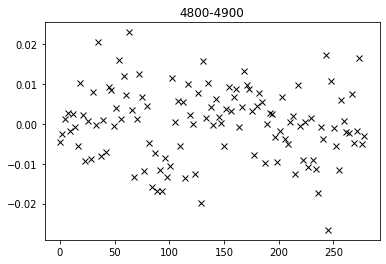

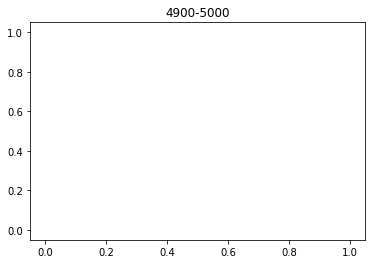

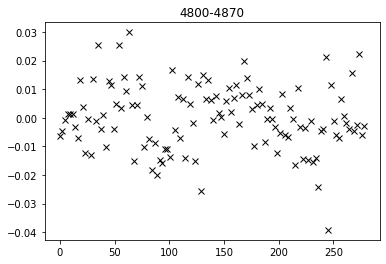

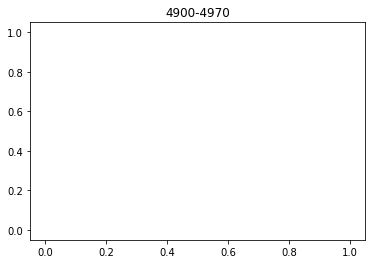

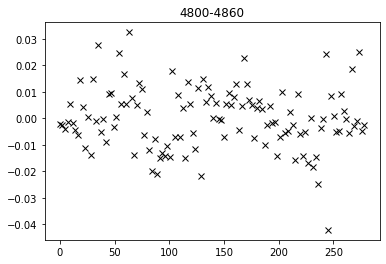

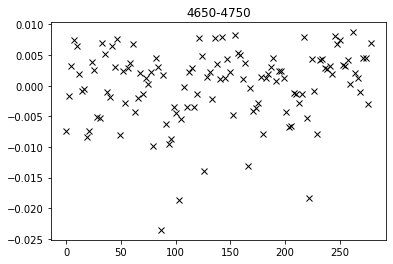

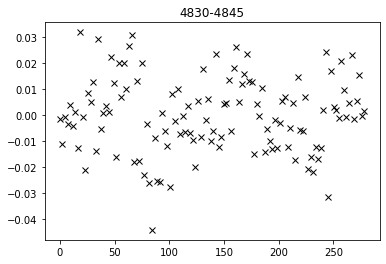

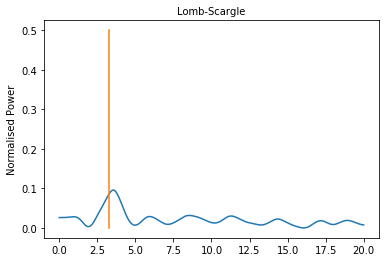

106.26898760222493


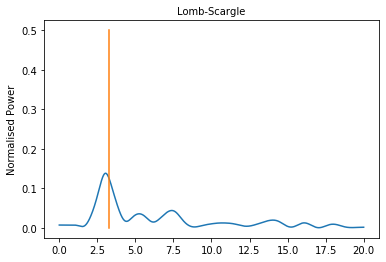

124.02185529090679


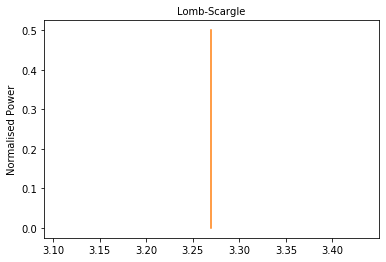

3769911.1843077512


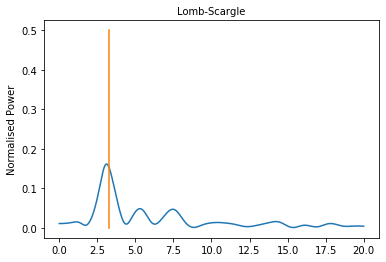

121.47228404269201


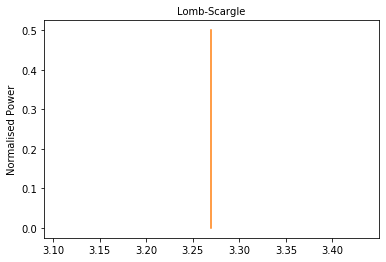

3769911.1843077512


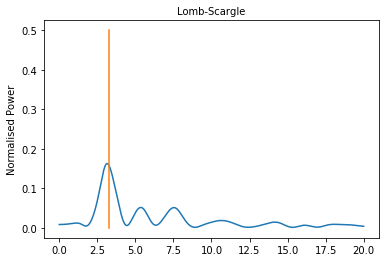

119.9113309983505


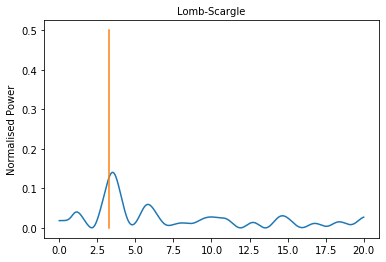

107.53607939057149


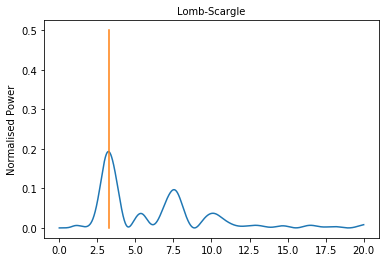

116.79086512102414


In [3]:

timeArray = []
timeOffset = datetime.strptime("0:00:00.0", '%H:%M:%S.%f')
dataArray1 = []
times = []
errorBars = []
counter = 0
timeArrayMay=[0.0, 2.33, 4.67, 7.02, 9.35, 11.68, 14.02, 16.37, 18.7, 21.03, 23.38, 25.72, 28.05, 30.4, 32.73, 35.07, 37.4, 39.75, 42.08, 44.42, 46.77, 49.1, 51.43, 53.77, 56.12, 58.45, 60.78, 63.13, 65.47, 67.8, 70.15, 72.48, 74.82, 77.15, 79.5, 81.83, 84.17, 86.52, 88.85, 91.18, 93.52, 95.87, 98.2, 100.53, 102.88, 105.22, 107.55, 109.9, 112.23, 114.57, 116.9, 119.25, 121.58, 123.92, 126.27, 128.6, 130.93, 133.27, 135.62, 137.95, 140.28, 142.63, 144.97, 147.3, 149.63, 151.98, 154.32, 156.65, 159.0, 161.33, 163.67, 166.0, 168.35, 170.68, 173.02, 175.37, 177.7, 180.03, 182.38, 184.72, 187.05, 189.38, 191.73, 194.07, 196.4, 198.75, 201.08, 203.42, 205.75, 208.1, 210.43, 212.77, 215.12, 217.45, 219.78, 222.12, 224.47, 226.8, 229.13, 231.48, 233.82, 236.15, 238.48, 240.83, 243.17, 245.5, 247.85, 250.18, 252.52, 254.87, 257.2, 259.53, 261.87, 264.22, 266.55, 268.88, 271.23, 273.57, 275.9, 278.23]
times = np.array(timeArrayMay) 

weights1 = []
weights2 = []
weights3 = []
weights4 = []
weights5 = []
weights6=[]
bigArray = []
weights7 = []
weights8 = []
stds = []
path = '/home/nwal/Desktop/gd356_isis/may19/sat2/'
with open(path+'BTarCropConOff') as file:
    for line in file:
        line = line.strip('\n')
        filepath = path + line
        hdul = fits.open(filepath)
        typeEx = hdul[0].data
        data = typeEx
        dataFil = gaussian_filter(data, sigma=2)
        xpoints = np.linspace(4679.9498, 4899.4757, 502)
        startIn = find_nearest_id(xpoints,4700)
        endIn = find_nearest_id(xpoints,4800)
        toavg = data[startIn:endIn]
        avvg = np.mean(toavg)
        weights1.append(avvg)
        
        
        startIn = find_nearest_id(xpoints,4800)
        endIn = find_nearest_id(xpoints,4900)
        toavg = data[startIn:endIn]
        avvg = np.mean(toavg)
        weights2.append(avvg)
        
        startIn = find_nearest_id(xpoints,4900)
        endIn = find_nearest_id(xpoints,5000)
        toavg = data[startIn:endIn]
        avvg = np.mean(toavg)
        weights3.append(avvg)
        
        startIn = find_nearest_id(xpoints,4800)
        endIn = find_nearest_id(xpoints,4870)
        toavg = data[startIn:endIn]
        avvg = np.mean(toavg)
        weights4.append(avvg)
        
        startIn = find_nearest_id(xpoints,4900)
        endIn = find_nearest_id(xpoints,4970)
        toavg = data[startIn:endIn]
        avvg = np.mean(toavg)
        weights5.append(avvg)
        
        startIn = find_nearest_id(xpoints,4800)
        endIn = find_nearest_id(xpoints,4860)
        toavg = data[startIn:endIn]
        avvg = np.mean(toavg)
        weights6.append(avvg)
        
        
        
        startIn = find_nearest_id(xpoints,4650)
        endIn = find_nearest_id(xpoints,4750)
        toavg = data[startIn:endIn]
        avvg = np.mean(toavg)
        weights7.append(avvg)
        
        startIn = find_nearest_id(xpoints,4830)
        endIn = find_nearest_id(xpoints,4845)
        toavg = data[startIn:endIn]
        avvg = np.mean(toavg)
        weights8.append(avvg)
        
        
        data1 = data[find_nearest_id(xpoints, 4800):find_nearest_id(xpoints, 4900)]
        if counter == 0:
            bigArray = data1
        else:
            bigArray = np.vstack((bigArray, data1))
        #plt.plot(xpoints, dataFil, color='k', lw='0.2')
        #plt.ylim(-0.1, 0.15)
        #plt.title(line)
        #plt.grid()
        #savepath = path + "pics/" + line + '.png'
        #plt.savefig(savepath, dpi=300)
        #plt.show()
        hdul.close()
        counter = counter+1

plt.plot(times, weights1, 'kx')
plt.title('4700-4800')
plt.show()

#rubbish
plt.plot(times, weights2, 'kx')
plt.title('4800-4900')
plt.show()

plt.plot(times, weights3, 'kx')
plt.title('4900-5000')
plt.show()

plt.plot(times, weights4, 'kx')
plt.title('4800-4870')
plt.show()

#rubbish
plt.plot(times, weights5, 'kx')
plt.title('4900-4970')
plt.show()

plt.plot(times, weights6, 'kx')
plt.title('4800-4860')
plt.show()

#rubbish
plt.plot(times, weights7, 'kx')
plt.title('4650-4750')
plt.show()

plt.plot(times, weights8, 'kx')
plt.title('4830-4845')
plt.show()



nout = 100000
f = np.linspace(0.0001, 20, nout)
times2 = np.array(times)/60

weightArr = [weights1,weights2,weights3,weights4,weights5,weights6,weights7,weights8]
for el in weightArr:
    
    dataArrayAc = el - np.mean(el)
    pgram = signal.lombscargle(times2, dataArrayAc, f, normalize=True)
    plt.plot(f, pgram)
    plt.title("Lomb-Scargle", fontsize=10)
    plt.ylabel("Normalised Power")
    plt.plot([3.27,3.27], [0,0.5], label=r"$\frac{2\pi}{1.92 \quad Hours}$")
    plt.show()
    indexMax = np.argmax(pgram)
    period = (2*np.pi/f[indexMax])*60
    print(period)

(120, 227)
(227, 120)


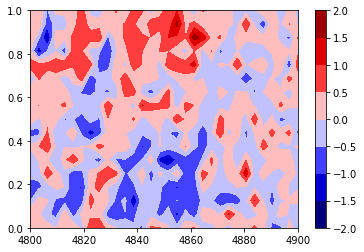

In [4]:
timeArray = []
timeOffset = datetime.strptime("0:00:00.0", '%H:%M:%S.%f')
dataArray1 = []
times = np.array(timeArrayMay) 
errorBars = []
counter = 0
 
stds = []
path = '/home/nwal/Desktop/gd356_isis/may19/sat2/'
with open(path+'BTarCropConOff') as file:
    for line in file:
        line = line.strip('\n')
        filepath = path + line
        hdul = fits.open(filepath)
        typeEx = hdul[0].data
        data = typeEx
        dataFil = gaussian_filter(data, sigma=2)
        xpoints = np.linspace(4679.9498, 4899.4757, 502)
        data1 = data[find_nearest_id(xpoints, 4800):find_nearest_id(xpoints, 4900)]
        if counter == 0:
            bigArray = data1
        else:
            
            bigArray = np.vstack((bigArray, data1))
        #plt.plot(xpoints, dataFil, color='k', lw='0.2')
        #plt.ylim(-0.1, 0.15)
        #plt.title(line)
        #plt.grid()
        #savepath = path + "pics/" + line + '.png'
        #plt.savefig(savepath, dpi=300)
        #plt.show()
        hdul.close()
        counter = counter+1



#phases = foldAt(time, 21.5, T0=217.4)
#print(type(time))

# Sort with respect to phase
# First, get the order of indices ...
#sortIndi = np.argsort(phases)
# ... and, second, rearrange the arrays.
#phases = phases[sortIndi]
#flux = flux[sortIndi]
print(np.shape(bigArray))
cnt = 0
times = np.array(times)
for row in np.transpose(bigArray):
    phases = foldAt(times, 120, T0=190)
    sortIndi = np.argsort(phases)
    phases = phases[sortIndi]
    flux = row[sortIndi]
    if cnt == 0:
        bigNewArray = flux
    else:
        bigNewArray = np.vstack((bigNewArray,flux))
    cnt = 1
Z = bigNewArray
print(np.shape(Z))
binned_data = binArray(Z, 0, 7, 7, np.sum)
binned_data = binArray(binned_data, 1, 7, 7, np.sum)
end = np.shape(binned_data)[0]
end2 = np.shape(binned_data)[1]
Xs, Ys = np.mgrid[4800:4900:complex(0, end), 0:1:complex(0, end2)]
plt.contourf(Xs,Ys,binned_data, cmap='seismic')
plt.colorbar()
plt.savefig('May19B.png', dpi=600)

# Print this ^

In [5]:
xpoints = np.linspace(5516.0723, 7529.0581, 4096)
dataStart = find_nearest_id(xpoints, 5690)
dataFinish = find_nearest_id(xpoints, 7000)
print(dataStart, dataFinish)

354 3019


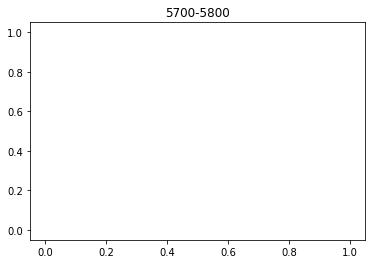

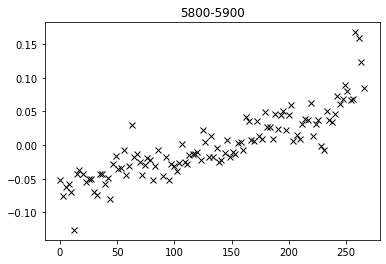

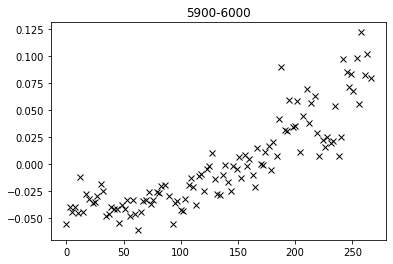

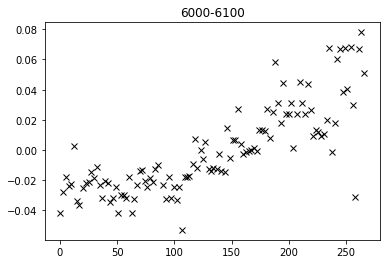

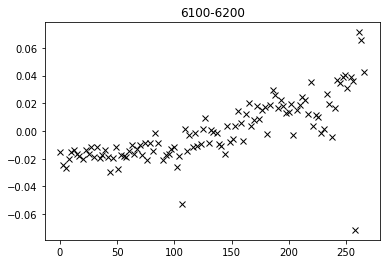

...

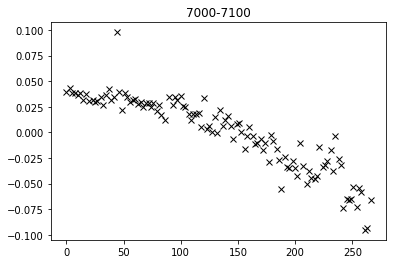

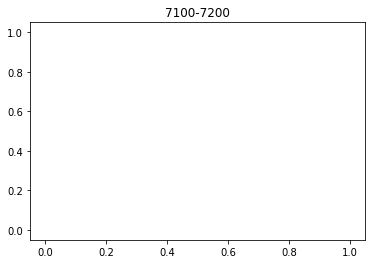

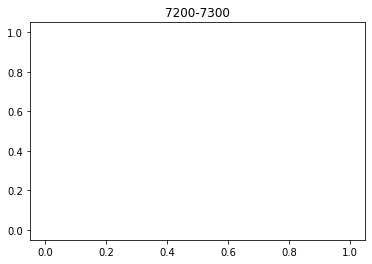

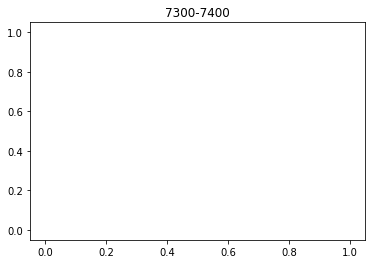

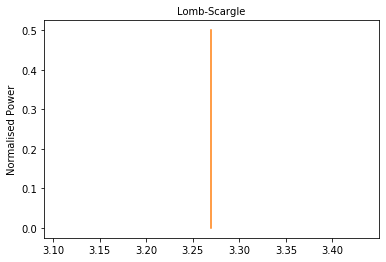

3769911.1843077512


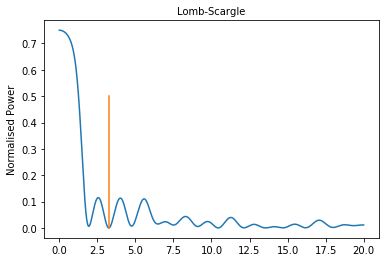

3769911.1843077512


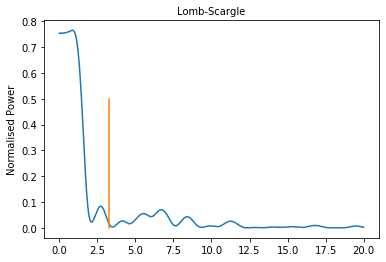

438.2067112459173


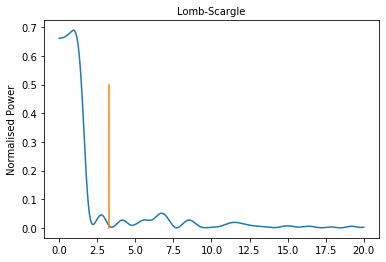

405.67011047949455


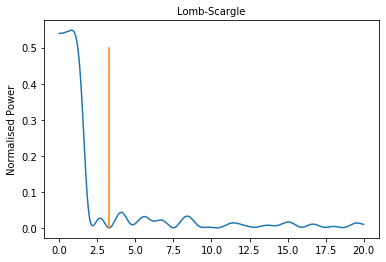

467.2068827603951


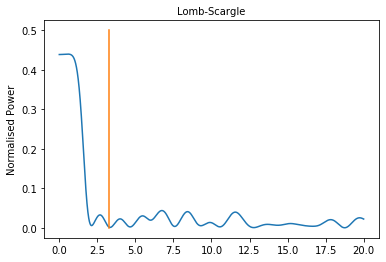

687.0589280285938


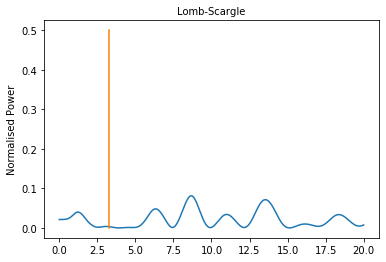

43.47651779906777


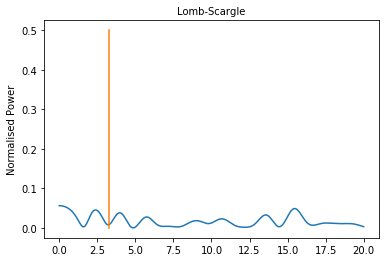

3769911.1843077512


In [6]:
timeArray = []
timeOffset = datetime.strptime("0:00:00.0", '%H:%M:%S.%f')
dataArray1 = []
times = []
errorBars = []
counter = 0



weights1 = []
weights2 = []
weights3 = []
weights4 = []
weights5 = []
weights6 = []
bigArray = []
weights7 = []
weights8 = []
weights9 = []
weights10 = []
weights11 = []
weights12 = []
weights13 = []
weights14 = []
weights15 = []
weights16 = []
weights17 = []
stds = []




path = '/home/nwal/Desktop/gd356_isis/jul18/sat2/'
with open(path+'RTarCrOff') as file:
    for line in file:
        line = line.strip('\n')
        filepath = path + line
        hdul = fits.open(filepath)
        timeStart = hdul[0].header['UTOBS']
        timeStart = datetime.strptime(timeStart, '%H:%M:%S.%f')
        if timeStart.hour < 21:
            timeStart = timeStart.replace(day=2)
        delta = total_seconds(timeStart)
        delta = (delta - 75900.5)/60
        delta = np.round(delta, 2)
        timeArray.append(delta)
        typeEx = hdul[0].data
        data = typeEx
        dataFil = gaussian_filter(data, sigma=2)
        xpoints = np.linspace(5690.0887, 7000.1270, 2666)
        startIn = find_nearest_id(xpoints,7200)
        endIn = find_nearest_id(xpoints,7300)
        toavg = data[startIn:endIn]
        avvg = np.mean(toavg)
        weights1.append(avvg)
        
        
        startIn = find_nearest_id(xpoints,5700)
        endIn = find_nearest_id(xpoints,5800)
        toavg = data[startIn:endIn]
        avvg = np.mean(toavg)
        weights2.append(avvg)
        
        startIn = find_nearest_id(xpoints,5800)
        endIn = find_nearest_id(xpoints,5900)
        toavg = data[startIn:endIn]
        avvg = np.mean(toavg)
        weights3.append(avvg)
        
        startIn = find_nearest_id(xpoints,5900)
        endIn = find_nearest_id(xpoints,6000)
        toavg = data[startIn:endIn]
        avvg = np.mean(toavg)
        weights4.append(avvg)
        
        startIn = find_nearest_id(xpoints,6000)
        endIn = find_nearest_id(xpoints,6100)
        toavg = data[startIn:endIn]
        avvg = np.mean(toavg)
        weights5.append(avvg)
        
        startIn = find_nearest_id(xpoints,6100)
        endIn = find_nearest_id(xpoints,6200)
        toavg = data[startIn:endIn]
        avvg = np.mean(toavg)
        weights6.append(avvg)
        
        
        
        startIn = find_nearest_id(xpoints,6200)
        endIn = find_nearest_id(xpoints,6300)
        toavg = data[startIn:endIn]
        avvg = np.mean(toavg)
        weights7.append(avvg)
        
        startIn = find_nearest_id(xpoints,6300)
        endIn = find_nearest_id(xpoints,6400)
        toavg = data[startIn:endIn]
        avvg = np.mean(toavg)
        weights8.append(avvg)
        
        startIn = find_nearest_id(xpoints,6400)
        endIn = find_nearest_id(xpoints,6500)
        toavg = data[startIn:endIn]
        avvg = np.mean(toavg)
        weights9.append(avvg)
        
        startIn = find_nearest_id(xpoints,6500)
        endIn = find_nearest_id(xpoints,6600)
        toavg = data[startIn:endIn]
        avvg = np.mean(toavg)
        weights10.append(avvg)
        
        startIn = find_nearest_id(xpoints,6600)
        endIn = find_nearest_id(xpoints,6700)
        toavg = data[startIn:endIn]
        avvg = np.mean(toavg)
        weights11.append(avvg)
        
        startIn = find_nearest_id(xpoints,6700)
        endIn = find_nearest_id(xpoints,6800)
        toavg = data[startIn:endIn]
        avvg = np.mean(toavg)
        weights12.append(avvg)
        
        startIn = find_nearest_id(xpoints,6800)
        endIn = find_nearest_id(xpoints,6900)
        toavg = data[startIn:endIn]
        avvg = np.mean(toavg)
        weights13.append(avvg)
        
        startIn = find_nearest_id(xpoints,6900)
        endIn = find_nearest_id(xpoints,7000)
        toavg = data[startIn:endIn]
        avvg = np.mean(toavg)
        weights14.append(avvg)
        
        startIn = find_nearest_id(xpoints,7000)
        endIn = find_nearest_id(xpoints,7100)
        toavg = data[startIn:endIn]
        avvg = np.mean(toavg)
        weights15.append(avvg)
        
        startIn = find_nearest_id(xpoints,7100)
        endIn = find_nearest_id(xpoints,7200)
        toavg = data[startIn:endIn]
        avvg = np.mean(toavg)
        weights16.append(avvg)
        
        startIn = find_nearest_id(xpoints,7200)
        endIn = find_nearest_id(xpoints,7300)
        toavg = data[startIn:endIn]
        avvg = np.mean(toavg)
        weights17.append(avvg)
        
        
        data1 = data[find_nearest_id(xpoints, 4800):find_nearest_id(xpoints, 4900)]
        if counter == 0:
            bigArray = data1
        else:
            bigArray = np.vstack((bigArray, data1))
        #plt.plot(xpoints, dataFil, color='k', lw='0.2')
        #plt.ylim(-0.1, 0.15)
        #plt.title(line)
        #plt.grid()
        #savepath = path + "pics/" + line + '.png'
        #plt.savefig(savepath, dpi=300)
        #plt.show()
        hdul.close()
        counter = counter+1
times=timeArray
plt.plot(times, weights1, 'kx')
plt.title('5700-5800')
plt.show()

#rubbish
plt.plot(times, weights2, 'kx')
plt.title('5800-5900')
plt.show()

plt.plot(times, weights3, 'kx')
plt.title('5900-6000')
plt.show()

plt.plot(times, weights4, 'kx')
plt.title('6000-6100')
plt.show()

#rubbish
plt.plot(times, weights5, 'kx')
plt.title('6100-6200')
plt.show()

plt.plot(times, weights6, 'kx')
plt.title('6200-6300')
plt.show()

#rubbish
plt.plot(times, weights7, 'kx')
plt.title('6300-6400')
plt.show()

plt.plot(times, weights8, 'kx')
plt.title('6400-6500')
plt.show()



plt.plot(times, weights9, 'kx')
plt.title('6500-6600')
plt.show()
plt.plot(times, weights10, 'kx')
plt.title('6600-6700')
plt.show()
plt.plot(times, weights11, 'kx')
plt.title('6700-6800')
plt.show()
plt.plot(times, weights12, 'kx')
plt.title('6800-6900')
plt.show()
plt.plot(times, weights13, 'kx')
plt.title('6900-7000')
plt.show()
plt.plot(times, weights14, 'kx')
plt.title('7000-7100')
plt.show()
plt.plot(times, weights15, 'kx')
plt.title('7100-7200')
plt.show()
plt.plot(times, weights16, 'kx')
plt.title('7200-7300')
plt.show()
plt.plot(times, weights17, 'kx')
plt.title('7300-7400')
plt.show()



nout = 100000
f = np.linspace(0.0001, 20, nout)
times2 = np.array(times)/60

weightArr = [weights1,weights2,weights3,weights4,weights5,weights6,weights7,weights8]
for el in weightArr:
    
    dataArrayAc = el - np.mean(el)
    pgram = signal.lombscargle(times2, dataArrayAc, f, normalize=True)
    plt.plot(f, pgram)
    plt.title("Lomb-Scargle", fontsize=10)
    plt.ylabel("Normalised Power")
    plt.plot([3.27,3.27], [0,0.5], label=r"$\frac{2\pi}{1.92 \quad Hours}$")
    plt.show()
    indexMax = np.argmax(pgram)
    period = (2*np.pi/f[indexMax])*60
    print(period)

(113, 2663)
(2663, 113)


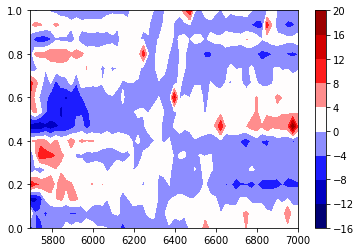

In [8]:

timeOffset = datetime.strptime("0:00:00.0", '%H:%M:%S.%f')
dataArray1 = []
 
errorBars = []
counter = 0
 
stds = []
path = '/home/nwal/Desktop/gd356_isis/jul18/sat2/'
with open(path+'RTarCrOff') as file:
    for line in file:
        line = line.strip('\n')
        filepath = path + line
        hdul = fits.open(filepath)
        typeEx = hdul[0].data
        data = typeEx
        dataFil = gaussian_filter(data, sigma=2)
        xpoints = np.linspace(5690.0887, 7000.1270, 2666)
        data1 = data[find_nearest_id(xpoints, 5691):find_nearest_id(xpoints, 7000)]
        if counter == 0:
            bigArray = data1
        else:
            
            bigArray = np.vstack((bigArray, data1))
        #plt.plot(xpoints, dataFil, color='k', lw='0.2')
        #plt.ylim(-0.1, 0.15)
        #plt.title(line)
        #plt.grid()
        #savepath = path + "pics/" + line + '.png'
        #plt.savefig(savepath, dpi=300)
        #plt.show()
        hdul.close()
        counter = counter+1



#phases = foldAt(time, 21.5, T0=217.4)
#print(type(time))

# Sort with respect to phase
# First, get the order of indices ...
#sortIndi = np.argsort(phases)
# ... and, second, rearrange the arrays.
#phases = phases[sortIndi]
#flux = flux[sortIndi]
print(np.shape(bigArray))
cnt = 0
times = np.array(timeArray)
for row in np.transpose(bigArray):
    phases = foldAt(times, 115, T0=0)
    sortIndi = np.argsort(phases)
    phases = phases[sortIndi]
    flux = row[sortIndi]
    if cnt == 0:
        bigNewArray = flux
    else:
        bigNewArray = np.vstack((bigNewArray,flux))
    cnt = 1
Z = bigNewArray
print(np.shape(Z))
binned_data = binArray(Z, 0, 50, 50, np.sum)
binned_data = binArray(binned_data, 1, 7, 7, np.sum)
end = np.shape(binned_data)[0]
end2 = np.shape(binned_data)[1]
Xs, Ys = np.mgrid[5691:7000:complex(0, end), 0:1:complex(0, end2)]
plt.contourf(Xs,Ys,binned_data, cmap='seismic')
plt.colorbar()
plt.savefig('Jul18R.png', dpi=600)

In [13]:
timeArray = []
timeOffset = datetime.strptime("0:00:00.0", '%H:%M:%S.%f')
dataArray1 = []
times = []
errorBars = []
counter = 0
weights = []
stds = []
path = '/home/nwal/Desktop/gd356_isis/may19/sat2/'
with open(path+'BTar') as file:
    for line in file:
        line = line.strip('\n')
        filepath = path + line
        hdul = fits.open(filepath)
        typeEx = hdul[0].data
        data = typeEx
        
        xpoints = np.linspace(3637.5303, 5394.6140, 4011)
        dataStart = find_nearest_id(xpoints, 4445)
        dataFinish = find_nearest_id(xpoints, 4635)
        #print(dataStartxpoints = np.linspace(3622.6323, 5418.2984, 4099)
        dataUn = data[dataStart:dataFinish]
        xArrS = find_nearest(xpoints, 4445)
        xArrF = find_nearest(xpoints, 4635)
        xArr = np.linspace(xArrS, xArrF, len(dataUn))
        res = np.poly1d(np.polyfit(xArr, dataUn, 1))
        means = func(res, xArr)
        diff = (np.abs(dataUn-means))**2
        summ = np.sqrt((np.sum(diff)/len(dataUn)))
        weights.append(1/(summ**2))
        hdul.close()

print(weights)
with open('/home/nwal/Desktop/gd356_isis/may19/sat2/Bweights', 'w') as f:
    for item in weights:
        f.write("%s\n" % item)

[0.000253643006702056, 0.00017961380304351275, 0.0019082789309066784, 0.0003070873274648662, 0.000710807988026162, 0.0009460819435045661, 0.0004324108636904723, 0.00021699941075532098, 0.0003619212008118559, 0.0012311866824964673, 0.0011862013697595101, 9.995208388460852e-05, 0.00028543017901325803, 0.0011733029723722578, 0.0005880460891392297, 0.00017559959865994838, 0.00036413257389506664, 0.0005026893386125643, 0.0006450845449390074, 0.0007151308835357501, 0.0002764638882273017, 0.00024845909100301575, 0.00038006212009666755, 0.0005464154338552562, 0.0009267413713348719, 0.0021545130831058528, 0.005813738047226769, 0.0022842717486605425, 6.429594372370513e-05, 0.0016254044190839355, 0.0012393156475680508, 9.930706101394339e-05, 0.0034967161730958037, 0.0008873015923687406, 1.194487334483469e-05, 0.00011159809669604909, 0.0010916564917742909, 5.76811760951355e-05, 0.00039160447588893935, 0.0004456719969911225, 0.0002353644754958718, 7.989697145682278e-05, 0.0008965813746361551, 0.000

In [60]:
timeArray = []
timeOffset = datetime.strptime("0:00:00.0", '%H:%M:%S.%f')
dataArray1 = []
times = []
errorBars = []
names = []
counter = 0
weights = []
stds = []
bigArray = []
means = []
path = '/home/nwal/Desktop/gd356_isis/may19/sat2/'
with open(path+'BTar') as file:
    for line in file:
        line = line.strip('\n')
        filepath = path + line
        hdul = fits.open(filepath)
        names.append(line)
        typeEx = hdul[0].data
        data = typeEx
        for indx, val in enumerate(data):
            if val < 0:
                data[indx] = 0
        xpoints = np.linspace(3637.5303, 5394.6140, 4011)
        dataStart = find_nearest_id(xpoints, 3700)
        dataFinish = find_nearest_id(xpoints, 5300)
        dataUn = data[dataStart:dataFinish]
        mean = np.mean(dataUn)
        means.append(mean)
        #print(dataStartxpoints = np.linspace(3622.6323, 5418.2984, 4099)
        if counter==0:
            bigArray = np.append(data,mean)
            bigArray = np.append(bigArray, counter)
            bigArray = np.append(bigArray, line)
            # append line
            # read off after argsort
        else:
            temp = np.append(data, mean)
            temp = np.append(temp, counter)
            bigArray = np.vstack((bigArray, np.append(temp,line)))
        counter = counter + 1
        hdul.close()
bigArray = bigArray[bigArray[:,-3].astype(float).argsort()]
print(bigArray[:,-3])

['380.40057373046875' '393.2715148925781' '399.44744873046875'
 '476.859619140625' '485.4080505371094' '521.822998046875'
 '528.3970947265625' '617.7447509765625' '620.511474609375'
 '651.5466918945312' '666.5813598632812' '672.407958984375'
 '705.5689086914062' '733.378173828125' '739.5367431640625'
 '756.5582275390625' '762.8276977539062' '780.17431640625' '823.201171875'
 '827.1187133789062' '839.0933837890625' '844.688720703125'
 '850.8229370117188' '866.5678100585938' '893.6141967773438'
 '900.4608764648438' '904.5431518554688' '912.5225830078125'
 '926.8485107421875' '928.9198608398438' '933.6397705078125'
 '935.6838989257812' '947.43408203125' '947.6887817382812'
 '954.7501220703125' '974.8768920898438' '981.9486694335938'
 '1011.5643920898438' '1034.4613037109375' '1044.5391845703125'
 '1067.8907470703125' '1106.092041015625' '1118.173095703125'
 '1118.693359375' '1136.8900146484375' '1139.447265625'
 '1144.0863037109375' '1157.70947265625' '1193.7069091796875'
 '1212.811523437

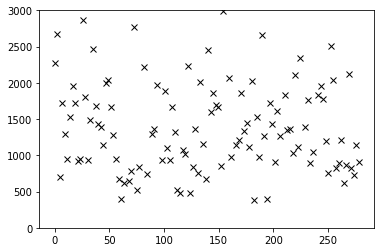

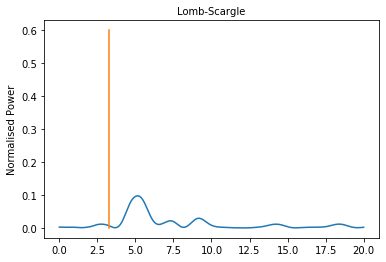

In [66]:
timeArrayMay=[0.0, 2.33, 4.67, 7.02, 9.35, 11.68, 14.02, 16.37, 18.7, 21.03, 23.38, 25.72, 28.05, 30.4, 32.73, 35.07, 37.4, 39.75, 42.08, 44.42, 46.77, 49.1, 51.43, 53.77, 56.12, 58.45, 60.78, 63.13, 65.47, 67.8, 70.15, 72.48, 74.82, 77.15, 79.5, 81.83, 84.17, 86.52, 88.85, 91.18, 93.52, 95.87, 98.2, 100.53, 102.88, 105.22, 107.55, 109.9, 112.23, 114.57, 116.9, 119.25, 121.58, 123.92, 126.27, 128.6, 130.93, 133.27, 135.62, 137.95, 140.28, 142.63, 144.97, 147.3, 149.63, 151.98, 154.32, 156.65, 159.0, 161.33, 163.67, 166.0, 168.35, 170.68, 173.02, 175.37, 177.7, 180.03, 182.38, 184.72, 187.05, 189.38, 191.73, 194.07, 196.4, 198.75, 201.08, 203.42, 205.75, 208.1, 210.43, 212.77, 215.12, 217.45, 219.78, 222.12, 224.47, 226.8, 229.13, 231.48, 233.82, 236.15, 238.48, 240.83, 243.17, 245.5, 247.85, 250.18, 252.52, 254.87, 257.2, 259.53, 261.87, 264.22, 266.55, 268.88, 271.23, 273.57, 275.9, 278.23]
times = np.array(timeArrayMay) 
plt.plot(times,means, 'kx')
plt.ylim(0,3000)
plt.show()
nout = 100000
f = np.linspace(0.0001, 20, nout)
times2 = np.array(times)/60
dataArrayAc = means - np.mean(means)
pgram = signal.lombscargle(times2, dataArrayAc, f, normalize=True)
plt.plot(f, pgram)
plt.title("Lomb-Scargle", fontsize=10)
plt.ylabel("Normalised Power")
plt.plot([3.27,3.27], [0,0.6], label=r"$\frac{2\pi}{1.92 \quad Hours}$")

In [56]:
counter_list = bigArray[:, -1]

In [57]:
print(counter_list)

['BGD356r2801399.ms.fits' 'BGD356r2801409.ms.fits'
 'BGD356r2801295.ms.fits' 'BGD356r2801341.ms.fits'
 'BGD356r2801349.ms.fits' 'BGD356r2801307.ms.fits'
 'BGD356r2801339.ms.fits' 'BGD356r2801297.ms.fits'
 'BGD356r2801470.ms.fits' 'BGD356r2801301.ms.fits'
 'BGD356r2801293.ms.fits' 'BGD356r2801361.ms.fits'
 'BGD356r2801247.ms.fits' 'BGD356r2801478.ms.fits'
 'BGD356r2801315.ms.fits' 'BGD356r2801457.ms.fits'
 'BGD356r2801355.ms.fits' 'BGD356r2801303.ms.fits'
 'BGD356r2801476.ms.fits' 'BGD356r2801464.ms.fits'
 'BGD356r2801309.ms.fits' 'BGD356r2801351.ms.fits'
 'BGD356r2801373.ms.fits' 'BGD356r2801472.ms.fits'
 'BGD356r2801466.ms.fits' 'BGD356r2801443.ms.fits'
 'BGD356r2801415.ms.fits' 'BGD356r2801481.ms.fits'
 'BGD356r2801261.ms.fits' 'BGD356r2801333.ms.fits'
 'BGD356r2801327.ms.fits' 'BGD356r2801269.ms.fits'
 'BGD356r2801253.ms.fits' 'BGD356r2801263.ms.fits'
 'BGD356r2801291.ms.fits' 'BGD356r2801381.ms.fits'
 'BGD356r2801403.ms.fits' 'BGD356r2801345.ms.fits'
 'BGD356r2801429.ms.fits' 'BGD3

In [58]:
with open('/home/nwal/Desktop/gd356_isis/may19/sat2/BTarSorted', 'w') as f:
    for item in counter_list:
        f.write("%s\n" % item)

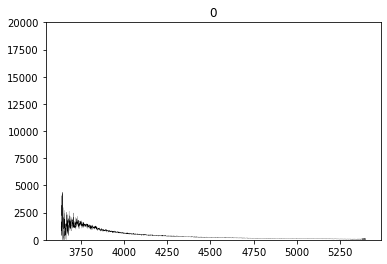

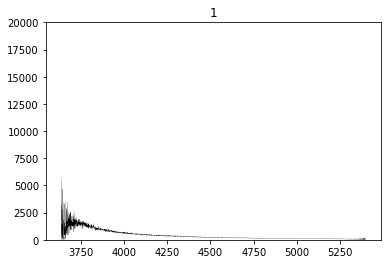

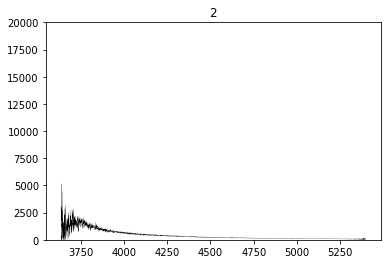

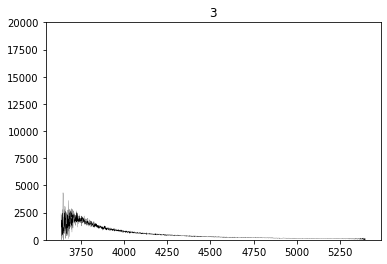

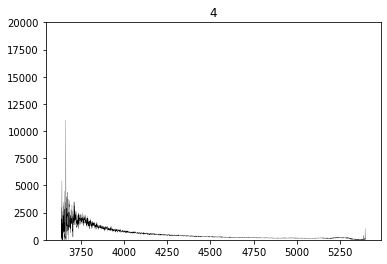

...

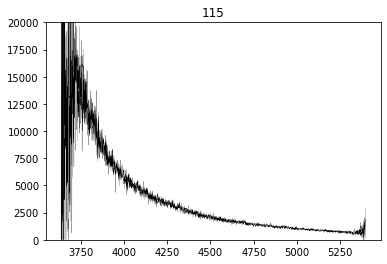

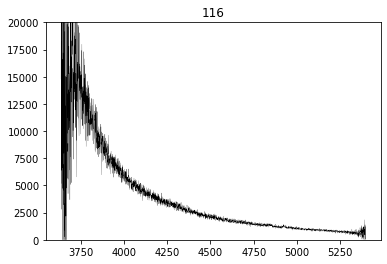

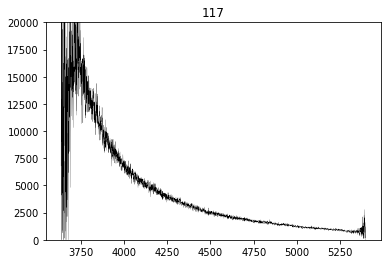

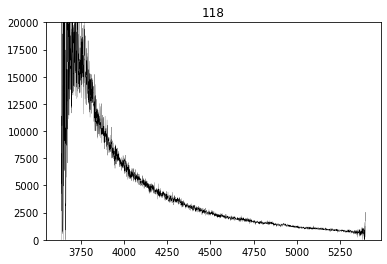

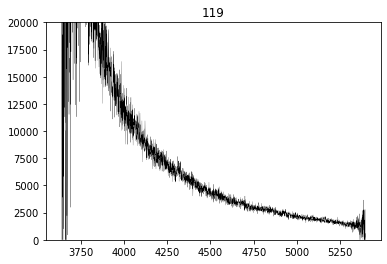

In [32]:
for i in range(120):
    toPlot = bigArray[i,:-1]
    plt.plot(xpoints, toPlot[:-1], lw=0.2, color='k')
    plt.title(str(i))
    plt.ylim(0,20000)
    plt.show()

In [39]:
weights = []
for i in range(120):
    toPlot = bigArray[i,:-1]
    toPlot = toPlot[:-1]
    xpoints = np.linspace(3637.5303, 5394.6140, 4011)
    dataStart = find_nearest_id(xpoints, 4445)
    dataFinish = find_nearest_id(xpoints, 4635)
    dataUn = toPlot[dataStart:dataFinish]
    xArrS = find_nearest(xpoints, 4445)
    xArrF = find_nearest(xpoints, 4635)
    xArr = np.linspace(xArrS, xArrF, len(dataUn))
    res = np.poly1d(np.polyfit(xArr, dataUn, 1))
    means = func(res, xArr)
    diff = (np.abs(dataUn-means))**2
    summ = np.sqrt((np.sum(diff)/len(dataUn)))
    weights.append(1/(summ**2))
with open('/home/nwal/Desktop/gd356_isis/may19/sat2/BweightsSort', 'w') as f:
    for item in weights:
        f.write("%s\n" % item)

In [38]:
print(weights)

[0.009128214439878745, 0.008025138867554444, 0.005813738047226769, 0.005319736456264642, 0.003333244512191404, 0.0034967161730958037, 0.004119213224013525, 0.0022842717486605425, 0.003980766646716674, 0.0016254044190839355, 0.0021545130831058528, 0.002363739207366884, 0.0019082789309066784, 0.0017014156977920396, 0.0010916564917742909, 0.003005140367171133, 0.0013426769140287953, 0.0012393156475680508, 0.0024032128412327463, 0.0024201468753848854, 0.0008873015923687406, 0.0015831513955376678, 0.001700971752073974, 0.0017870904844363715, 0.0021142360695907154, 0.0014457069013065185, 0.0016657393886591095, 0.0016540310840799021, 0.0012311866824964673, 0.0006811003815400382, 0.0008965813746361551, 0.0011733029723722578, 0.0009460819435045661, 0.0011862013697595101, 0.0009267413713348719, 0.0013526062453298475, 0.0014025978450208038, 0.0010681761843866608, 0.001123462796633157, 0.0008749712959354438, 0.000918753341213683, 0.0006096266920046345, 0.0006948000755534656, 0.000962597619288805, 

In [74]:
timeArray = []
timeOffset = datetime.strptime("0:00:00.0", '%H:%M:%S.%f')
dataArray1 = []
times = []
errorBars = []
counter = 0
weights = []
stds = []
path = '/home/nwal/Desktop/gd356_isis/may19/sat/'
with open(path+'RTar') as file:
    for line in file:
        line = line.strip('\n')
        filepath = path + line
        hdul = fits.open(filepath)
        typeEx = hdul[0].data
        data = typeEx
        
        xpoints = np.linspace(5569.6499, 7383.4237, 3691)        
        dataStart = find_nearest_id(xpoints, 5900)
        dataFinish = find_nearest_id(xpoints, 6200)
        #print(dataStartxpoints = np.linspace(3622.6323, 5418.2984, 4099)
        dataUn = data[dataStart:dataFinish]
        xArrS = find_nearest(xpoints, 5900)
        xArrF = find_nearest(xpoints, 6200)
        xArr = np.linspace(xArrS, xArrF, len(dataUn))
        res = np.poly1d(np.polyfit(xArr, dataUn, 1))
        means = func(res, xArr)
        diff = (np.abs(dataUn-means))**2
        summ = np.sqrt((np.sum(diff)/len(dataUn)))
        weights.append(1/(summ**2))
        hdul.close()

print(weights)
with open('/home/nwal/Desktop/gd356_isis/may19/sat/Rweights', 'w') as f:
    for item in weights:
        f.write("%s\n" % item)

[0.0013276133304316593, 0.0004304699137093397, 0.0015196149532059474, 0.0008986407075003388, 0.0018034127808935275, 0.0011216122936014187, 0.0018517293599182977, 0.0014626558361017386, 0.0015775670265764548, 0.0017419053328058122, 0.0013003569847063543, 0.0011641872791003588, 0.0007467969200429359, 0.01181284886312349, 0.0015694103978118163, 0.0011942226713196208, 0.0016360386468841975, 0.001412556316028496, 0.0009362398089711933, 1.049133813823048e-05, 0.0012002917491266776, 0.0012345706233484646, 0.0017177581227946976, 0.0020253654463219225, 0.0013830654256319175, 0.0022717038488909917, 0.001227748475146286, 0.0013870874808865992, 0.002670457977196304, 0.0013986863502686996, 0.002670819861180686, 0.002962735614689387, 0.002354834837745737, 0.0024045018124998555, 0.0006325237420735927, 0.005024959879384469, 0.010599950391245122, 0.00019028342654336597, 0.002130790973661253, 0.0013909759247868504, 0.0005871920732125654, 0.0017384921364073838, 0.002307626173819199, 0.0003446594810322333

In [19]:
x = np.linspace(0, 4200)
y = 874.00 -(0.30899*x) + (0.000036113*x*x)


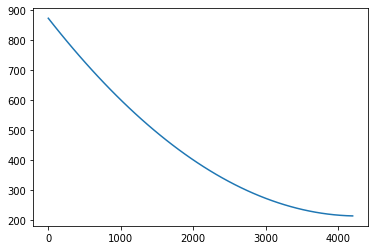

In [20]:
plt.plot(x,y)